In [4]:
# import required modules
import warnings
#warnings.filterwarnings('ignore')

import requests
import sys
stdout = sys.stdout 

import pickle

import re
import os
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors as mpl_colors
from matplotlib import cm

import pickle



from skimage.io import imsave
from skimage.io import imread

from sklearn.preprocessing import MinMaxScaler
from statsmodels.stats.multitest import multipletests
from scipy.stats import ttest_ind, sem
from scipy.signal import find_peaks

import seaborn.apionly as sns
sns.set_context("poster")

from IPython.display import display

%matplotlib inline

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

sys.stdout = stdout

plt.rcParams['svg.fonttype'] = 'none'

/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/seaborn/apionly.py:6: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)
/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/matplotlib/__init__.py:855: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))
/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/matplotlib/__init__.py:846: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 2.2 and will be removed in 3.1.
  "2.2", name=key, obj_type="rcparam", addendum=addendum)


### global constants

In [6]:
# base directory/working directory
DIR = '.'
# cell classes that have been investigated
cell_classes = ['C1/2','C3','C4','C5','C6','C7/8/9/10','C11/12','C13']
# color schemes
class_to_color =  {'ambig':'lightgray','nd':'lightgray','C3':'green','C13':'darkorange','C11/12':'purple','C7/8/9/10':'magenta','C1/2':'cyan','C4':'blue','C5':'gold','C6':'red'}
profile_to_color = {'airpuff':'cyan','vibration':'lightskyblue','brushpuff':'royalblue','brush':'magenta','htspec':'red'}
# standard set of stimuli
STANDARD_STIM = ['airpuff','vibration','brush_with','hairpull1','pinch1']

# some functions to visualize the traces

In [7]:
def normalize_traces_median_pinch(subframe):
    norm_traces = []
    medianpinch = subframe.MAX_pinch1.median()
    for row in subframe.itertuples(index=False):
        norm_traces.append({stim:[x/medianpinch for x in trace] for stim,trace in row.traces.items()})
    return pd.Series(norm_traces,index=subframe.index)

In [8]:
def show_traces(df,stimuli=['airpuff','vibration','brush_with','pinch1'],\
                profiles=None,figsize='relative',\
                cmap='magma',dropna=False,vmin=None,vmax=None,title='Title'):
    frames = []
    for stim in stimuli:
        frame = df.apply(lambda row: pd.Series(row['traces'][stim] if (stim in row['traces'].keys()) else [np.nan,]*200),axis=1)
        frames.append(frame)
    result = pd.concat(frames,axis=1)
    
    if profiles is not None:
        result['profile']=pd.Categorical(df.profile,categories=profiles,ordered=True)
        result.sort_values('profile',inplace=True)
        result = result.drop('profile',axis=1)
        
    if dropna:
        result = result.dropna(axis=0)
        
        
    
    #display
    if figsize == 'relative':
        figsize = (1 + result.shape[1]/80 ,1 + result.shape[0]/100)
        
    fig = plt.figure(figsize=figsize)
    plt.set_cmap("magma")
    
    
    ax = plt.gca()
    
    
    masked_data = np.ma.masked_invalid(result)

    if vmin is None:
        vmin=np.nanmin(masked_data)
    if vmax is None:
        vmax=np.nanmax(masked_data)
    heatmap = ax.pcolor(masked_data, cmap=cmap, 
                    vmin=vmin, vmax=vmax)
    # https://stackoverflow.com/a/16125413/190597 (Joe Kington) for gray coloring of Nan
    ax.patch.set_color('black')
    fig.colorbar(heatmap)


    #heatmap = plt.imshow(result, aspect='auto')
    #plt.title(title)
    #plt.xticks([i*200 + 100 for i in range(len(stimuli))],stimuli)
    #plt.yticks(range(df.shape[0]),list(df['class']));
    #plt.xticks(rotation=45);
    plt.axis('off')
    
    return result

In [9]:
def get_traces(df,stimuli=['airpuff','brush_with','pinch1'],dropna=False,normalize=False):
    frames = []
    for stim in stimuli:
        frame = df.apply(lambda row: pd.Series(row['traces'][stim] if (stim in row['traces'].keys()) else [np.nan,]*200),axis=1)
        frames.append(frame)
    result = pd.concat(frames,axis=1)
    result.index = df.index
    if dropna:
        result = result.dropna(axis=1)
        
    if normalize:
        result = pd.DataFrame(MinMaxScaler().fit_transform(result.values))
        
    return result

In [10]:
def plot_traces(df,stimuli=['airpuff','brush_with','pinch1'],dropna=False,normalize=False,**kwargs):
    frames = []
    for stim in stimuli:
        frame = df.apply(lambda row: pd.Series(row['traces'][stim] if (stim in row['traces'].keys()) else [np.nan,]*200),axis=1)
        frames.append(frame)
    result = pd.concat(frames,axis=1).T
    
    if dropna:
        result = result.dropna(axis=1)
        
    if normalize:
        
        result = pd.DataFrame(MinMaxScaler().fit_transform(result.values))

    
    result.index = [x for x in range(result.shape[0])]
    result.plot(**kwargs)
    plt.gca().get_legend().remove()
    

In [11]:
def plot_single_traces(df,colors, stimuli=['airpuff','brush_with','pinch1'],label=False,axis=False,height=0.5,**kwargs):
    frames = []
    for stim in stimuli:
        frame = df.apply(lambda row: pd.Series(row['traces'][stim] if (stim in row['traces'].keys()) else [np.nan,]*200),axis=1)
        frames.append(frame)
    result = pd.concat(frames,axis=1)
    
    result.columns = [x for x in range(result.shape[1])]
    result = result.reset_index().drop(['index'],axis=1)
    n = result.shape[0]
    
    plt.figure(figsize=(len(stimuli)*3,n*height))
    for i,row in result.iterrows():
        ax = plt.subplot(n,1,i+1)
        plt.plot(row,color=colors[i],**kwargs)
        ax.get_xaxis().set_visible(False)
        ax.spines['bottom'].set_visible(False)
        
        if label:
            
            plt.title(df.index[i])
        if not axis:
            plt.axis('off');

In [12]:
def plot_avg(df,ax,stimuli=['airpuff','brush_with','pinch1'],dropna=False,normalize=False,**kwargs):
    frames = []
    for stim in stimuli:
        frame = df.apply(lambda row: pd.Series(row['traces'][stim] if (stim in row['traces'].keys()) else [np.nan,]*200),axis=1)
        frames.append(frame)
    result = pd.concat(frames,axis=1).T
    
    if dropna:
        result = result.dropna(axis=1)
        
    if normalize:
        result = pd.DataFrame(MinMaxScaler().fit_transform(result.values))
        
    result.index = [x for x in range(result.shape[0])]
    avg = result.mean(axis=1)
    std = result.std(axis=1)
    upper_ci = avg + std
    lower_ci = avg - std
    
    ax.plot(result.index, avg, alpha = 1,**kwargs)
    

# Functions to import data from mastersheet and individual files

In [13]:
def fix_roi_indices(df,ganglion):
    # reduce roi names from 2 to 3 numbers and concatenate to date
    sep = '-'
    df.index = [str(ganglion) + '-' + sep.join(name.split(sep)[-2:]) for name in df.index]
    return df


def get_global_stats(trace_frame):
    # takes Series of traces and returns frame of stats (min, max, mean, std, maybe shoulder)
    stat_frame = trace_frame.apply(pd.DataFrame.describe, axis=1)
    stat_frame.columns = ['STAT_' + str(x) for x in stat_frame.columns]
    return stat_frame

def split_trace(trace_frame,stimlist):
    # takes trace_frame and stimlist and splits into a dictionary 
    assert len(stimlist)*200 == trace_frame.shape[1],'number of stimuli does not fit sheet' 
    trace_frame=trace_frame.apply(lambda row:{stimulus:row.iloc[(i*200):((i+1)*200)].tolist() for i,stimulus in enumerate(stimlist)},axis=1)
    return pd.DataFrame(trace_frame,columns=['traces'])
    
    
def get_maxvalues(tracedicts):
    # takes Series of trace dictionaries and returns Frame of maxvalues
    max_frame = tracedicts.apply(lambda tracedict: pd.Series({stimulus:np.max(trace) for stimulus,trace in tracedict.items()}))
    max_frame.columns = ['MAX_' + x for x in max_frame.columns]
    return max_frame
    
    
def get_combined(max_frame):
    # takes frame of maxvalues and returns combined values ratios etc.
    comb_frame = pd.DataFrame()
    comb_frame['COMB_airpuff'] = max_frame.filter(regex = r'airpuff', axis = 1).max(axis=1)
    comb_frame['COMB_brush'] = max_frame.filter(regex = r'brush', axis = 1).max(axis=1)
    comb_frame['COMB_hairpull'] = max_frame.filter(regex = r'hairpull', axis = 1).max(axis=1)
    comb_frame['COMB_pinch'] = max_frame.filter(regex = r'pinch', axis = 1).max(axis=1)
    comb_frame['COMB_vibration'] = max_frame.filter(regex = r'vibration', axis = 1).max(axis=1)
    comb_frame['COMB_ht'] = max_frame.filter(regex = r'(pinch1|hairpull1)', axis = 1).max(axis=1)
    comb_frame['COMB_lt'] = max_frame.filter(regex = r'(airpuff|brush_with)', axis = 1).max(axis=1)
    return comb_frame

def get_ratios(max_frame,comb_frame):
    ratio_frame = pd.DataFrame()
    ratio_frame['RATIO_airpuff_brush'] = max_frame['MAX_airpuff']/max_frame['MAX_brush_with']
    ratio_frame['RATIO_airpuff_ht'] = max_frame['MAX_airpuff']/comb_frame['COMB_ht']
    ratio_frame['RATIO_brush_ht'] = max_frame['MAX_brush_with']/comb_frame['COMB_ht']
    ratio_frame['RATIO_lt_ht'] = comb_frame['COMB_lt']/comb_frame['COMB_ht']
    ratio_frame['RATIO_hairpull_pinch'] = comb_frame['COMB_hairpull']/comb_frame['COMB_pinch']
    return ratio_frame

def fill_in_probes(annot_frame):
    for probe in ['ISH_' + p for p in ['trpm8','cd34','fxyd2','tmem233','etv1','mrgprd','s100b',\
                                      'scn10a','trpv1','calca','tagrfp']]:
        if probe not in annot_frame.columns:
            annot_frame[probe] = np.nan
    return annot_frame
                                     
def get_classes(annot_frame):
    annot_frame = fill_in_probes(annot_frame)
    class_frame = pd.DataFrame(np.nan,index = annot_frame.index, columns=['C1/2','C3','C4','C5','C6','C7/8/9/10','C11/12','C13'])
    
    C1_tested = ~(annot_frame.ISH_trpm8.isnull())
    C1 = annot_frame.ISH_trpm8 > 0                                  
    class_frame.loc[C1_tested,'C1/2'] = C1[C1_tested]
    
    C3_tested = ~np.logical_and(annot_frame.ISH_cd34.isnull(),\
                                np.logical_or.reduce((annot_frame.ISH_fxyd2.isnull(),\
                                              annot_frame.ISH_s100b.isnull(),\
                                             np.logical_and(annot_frame.ISH_tmem233.isnull(),\
                                                           np.logical_or(annot_frame.ISH_etv1.isnull(),annot_frame.ISH_mrgprd.isnull())))))
    C3 = np.logical_or(annot_frame.ISH_cd34 > 0,\
                                np.logical_and.reduce((annot_frame.ISH_fxyd2 > 0,\
                                                       annot_frame.ISH_s100b == 0,\
                                             ~np.logical_or.reduce((annot_frame.ISH_tmem233 > 0,\
                                                           annot_frame.ISH_etv1 >0,annot_frame.ISH_mrgprd >0)))))
    class_frame.loc[C3_tested,'C3'] = C3[C3_tested]
                                     
    C4_tested = ~np.logical_or.reduce((annot_frame.ISH_s100b.isnull(),annot_frame.ISH_scn10a.isnull(),\
                                      annot_frame.ISH_fxyd2.isnull()))
    C4 = np.logical_and.reduce((annot_frame.ISH_s100b > 0,annot_frame.ISH_scn10a == 0,\
                                      annot_frame.ISH_fxyd2 == 0))
    class_frame.loc[C4_tested,'C4'] = C4[C4_tested]
    
    C5_tested = ~np.logical_or(annot_frame.ISH_s100b.isnull(),annot_frame.ISH_fxyd2.isnull())
    C5 = np.logical_and(annot_frame.ISH_s100b > 0,annot_frame.ISH_fxyd2 >0)
    class_frame.loc[C5_tested,'C5'] = C5[C5_tested]
    
    C6_tested = ~np.logical_or(annot_frame.ISH_s100b.isnull(),annot_frame.ISH_scn10a.isnull())
    C6 = np.logical_and(annot_frame.ISH_s100b > 0,annot_frame.ISH_scn10a >0)
    class_frame.loc[C6_tested,'C6'] = C6[C6_tested]
                                     

    C7_tested = ~np.logical_or.reduce((np.logical_and.reduce((annot_frame.ISH_trpv1.isnull(),\
                                                      annot_frame.ISH_calca.isnull(),\
                                                      annot_frame.ISH_tagrfp.isnull())),
                                annot_frame.ISH_s100b.isnull(),
                                annot_frame.ISH_fxyd2.isnull(),
                                np.logical_and(annot_frame.ISH_etv1.isnull(),\
                                             annot_frame.ISH_tmem233.isnull())))
    C7 = np.logical_and.reduce((np.logical_or.reduce((annot_frame.ISH_trpv1 > 0,\
                                                      annot_frame.ISH_calca > 0,\
                                                      annot_frame.ISH_tagrfp > 0)),
                                annot_frame.ISH_s100b == 0,
                                annot_frame.ISH_fxyd2 == 0,
                                np.logical_or(annot_frame.ISH_etv1 == 0,\
                                             annot_frame.ISH_tmem233 == 0)))
    class_frame.loc[C7_tested,'C7/8/9/10'] = C7[C7_tested]
                                     
    C11_tested = ~np.logical_or(annot_frame.ISH_s100b.isnull(),\
                         np.logical_and(annot_frame.ISH_etv1.isnull(),\
                                      np.logical_or(annot_frame.ISH_tmem233.isnull(),annot_frame.ISH_mrgprd.isnull())))
    C11 = np.logical_and(annot_frame.ISH_s100b == 0,\
                         np.logical_or(annot_frame.ISH_etv1 > 0,\
                                      np.logical_and(annot_frame.ISH_tmem233 > 0,annot_frame.ISH_mrgprd == 0)))
    class_frame.loc[C11_tested,'C11/12'] = C11[C11_tested]
                                     
    C13_tested = ~np.logical_and(annot_frame.ISH_mrgprd.isnull(),\
                         np.logical_or.reduce((annot_frame.ISH_etv1.isnull(),\
                                      annot_frame.ISH_tmem233.isnull(),annot_frame.ISH_s100b.isnull())))
    C13 = np.logical_or(annot_frame.ISH_mrgprd > 0,\
                         np.logical_and.reduce((annot_frame.ISH_etv1 == 0,\
                                      annot_frame.ISH_tmem233 > 0,annot_frame.ISH_s100b == 0)))
    class_frame.loc[C13_tested,'C13'] = C13[C13_tested]
    
    
    cell_class = class_frame.idxmax(axis=1)
    cell_class[class_frame.sum(axis=1) == 0] = 'nd'
    cell_class[class_frame.sum(axis=1) > 1] = 'ambig'
    class_frame['class'] = cell_class.fillna('nd')
                                     
    return class_frame                                 
    
def load_data(masterfile):
    
    mastersheet = pd.read_excel(masterfile,header = 0)
    mastersheet['stim'] = mastersheet.apply(lambda row: [x.strip() for x in row['stim'].split(',')],axis=1)
    mastersheet['probes'] = None
    all_frames = []
    
    # for each date load annotation file, 
    for idx,row in mastersheet.iterrows():
        print(row.ganglion)
        # read and format ISH annotation file
        annot_file = os.path.join(DIR,str(row.ganglion) + '-annotation.csv')
        annot_frame = pd.read_csv(annot_file,header=0,index_col=0)
        

        annot_frame = annot_frame.replace({9:np.nan,5.0:0.5})
        genelist = [x.lower() for x in annot_frame.columns.values]
        mastersheet.loc[idx,'probes'] = [genelist,]
        annot_frame.columns = ['ISH_' + x for x in genelist]
        annot_frame['genelist']=[genelist,] * annot_frame.shape[0]
        annot_frame['original_roiname'] = annot_frame.index
        annot_frame = fix_roi_indices(annot_frame,row.ganglion)
        
        # get cell classes
        class_frame = get_classes(annot_frame)
                                     
        # read and format trace file
        trace_file = os.path.join(DIR,str(row.ganglion) + '-traces.csv')
        trace_frame = pd.read_csv(trace_file,header=0,index_col=0).T
        trace_frame = fix_roi_indices(trace_frame,row.ganglion)
        
        # write stimlist into annotation frame
        stimlists = pd.Series([row.stim,] * trace_frame.shape[0],name='stimuli',index=trace_frame.index)
        
        # get global stats
        stat_frame = get_global_stats(trace_frame)
        stat_frame['STAT_bottom50std'] = trace_frame.apply(lambda trace:np.std(trace[trace <= np.quantile(trace,0.5)]),axis=1)
        
        
        # split up traces into stimuli
        split_traces = split_trace(trace_frame,row.stim)
        

        max_frame = get_maxvalues(split_traces['traces'])
        
        comb_frame = get_combined(max_frame)
        
        ratio_frame = get_ratios(max_frame, comb_frame)
        
        frame = pd.concat([annot_frame,class_frame, pd.DataFrame(stimlists), split_traces,stat_frame,max_frame,comb_frame,ratio_frame],join='inner',axis=1)
        frame['ganglion'] = str(row.ganglion)
        frame['date'] = pd.to_datetime(re.sub('[^0-9]','', str(row.ganglion)),format='%Y%m%d')
        frame['genotype'] = row.genotype
        
        all_frames.append(frame)
        
    all_frames = pd.concat(all_frames,axis=0)
    
    return all_frames
    




## download data from Mendeley

download cell_info.csv, cell_traces.csv, calb2cre_allcells.csv and 4pinches_wt.csv from Mendeley (http://dx.doi.org/10.17632/hct95nx3t8.1) into working directory specified as DIR

## Reconstitute data from csv files

In [24]:
info = pd.read_csv(os.path.join(DIR,'cell_info.csv'),header=0,index_col=0)
traces = pd.read_csv(os.path.join(DIR,'cell_traces.csv'),index_col=0,header=0)
traces = split_trace(traces,STANDARD_STIM)
mechano = pd.concat([info,traces],join='inner',axis=1)


# Re-calculate categories of mechanosensory cells 

In [26]:
# profile all mechano cells

# calculate threshold for reliable response
z = 10
thresh = mechano.STAT_bottom50std * z

# initialize profile columns
mechano['profile'] = 'other'

# airpuff cells have peak ratio of airpuff/brush > 2
mechano.loc[np.logical_and(mechano.MAX_airpuff > thresh,mechano.RATIO_airpuff_brush > 2,\
                       ),'profile'] = 'airpuff'

# mixed responders (=brushpuff in this notebook) have a airpuff/brush ratio between 0.5 and 2
mechano.loc[np.logical_and.reduce((mechano.MAX_brush_with > thresh,\
                                         mechano.MAX_airpuff > thresh,
                                         mechano.RATIO_airpuff_brush > 0.5,\
                                        mechano.RATIO_airpuff_brush <= 2)),\
                       'profile'] = 'brushpuff'

# brush cells have an airpuff/brush ratio <= 0.5 and a low threshold/ high threshold response ratio
# >= 0.33
mechano.loc[np.logical_and.reduce((mechano.MAX_brush_with > thresh,\
                                         mechano.RATIO_airpuff_brush <= 0.5,
                                        mechano.RATIO_lt_ht >= 0.33)),\
                       'profile'] = 'brush'

# high threshold specific cells have a low threshold/high threshold ratio < 0.33
mechano.loc[np.logical_and(mechano.COMB_ht > thresh,mechano.RATIO_lt_ht < 0.33),'profile'] = 'htspec'

# vibration-only cells respond 3 times better to vibration than to anything else
mechano.loc[np.logical_and.reduce((mechano.MAX_vibration > thresh,\
                                  mechano.RATIO_airpuff_vibration < 0.33,\
                                  mechano.RATIO_vibration_brush > 3,
                                  mechano.RATIO_vibration_ht >3)),'profile'] = 'vibration'

In [27]:
#split into wt and ko
wt_df = mechano.loc[mechano.genotype == 'Tac1tagRFP',:]
ko_df = mechano.loc[mechano.genotype == 'Piezo2ko',:]

## numbers of responding cells that were tested for each cell class

In [174]:
for c in cell_classes:
    tested = np.sum(~wt_df[c].isnull())
    pos = np.sum(wt_df[c])
    print(c,": ",str(pos)+"/"+str(tested))
    


for p,g in wt_df.groupby('profile'):
    print(p)
    for c in cell_classes:
        tested = np.sum(~g[c].isnull())
        pos = np.sum(g[c])
        print(c,": ",str(pos)+"/"+str(tested))
    


C1/2 :  2/496
C3 :  197/1017
C4 :  250/941
C5 :  156/1403
C6 :  135/1098
C7/8/9/10 :  42/1016
C11/12 :  80/1000
C13 :  165/962
airpuff
C1/2 :  2/39
C3 :  0/100
C4 :  85/91
C5 :  1/134
C6 :  3/119
C7/8/9/10 :  1/100
C11/12 :  3/88
C13 :  2/90
brush
C1/2 :  0/167
C3 :  161/347
C4 :  48/357
C5 :  119/486
C6 :  5/403
C7/8/9/10 :  8/347
C11/12 :  14/368
C13 :  26/358
brushpuff
C1/2 :  0/32
C3 :  8/59
C4 :  31/58
C5 :  21/82
C6 :  2/75
C7/8/9/10 :  1/59
C11/12 :  0/61
C13 :  3/56
htspec
C1/2 :  0/235
C3 :  28/469
C4 :  38/383
C5 :  11/634
C6 :  124/441
C7/8/9/10 :  32/469
C11/12 :  62/442
C13 :  134/420
vibration
C1/2 :  0/23
C3 :  0/42
C4 :  48/52
C5 :  4/67
C6 :  1/60
C7/8/9/10 :  0/41
C11/12 :  1/41
C13 :  0/38


# number of wt and ko animals tested for each class

In [279]:
# total number of wt animals
len(wt_df['ganglion'].unique())

26

In [82]:
# number of wt animals tested for each class
for c in cell_classes:
    print(c,': ',len(wt_df[~wt_df[c].isnull()]['ganglion'].unique()))

C1/2 :  5
C3 :  12
C4 :  12
C5 :  18
C6 :  15
C7/8/9/10 :  12
C11/12 :  11
C13 :  11


In [293]:
# number of wt cells tested for each class
for c in cell_classes:
    print(c,': ',len(wt_df[~wt_df[c].isnull()]))

C1/2 :  496
C3 :  1017
C4 :  941
C5 :  1403
C6 :  1098
C7/8/9/10 :  1016
C11/12 :  1000
C13 :  962


In [83]:
# number of ko animals tested for each class
for c in cell_classes:
    print(c,': ',len(ko_df[~ko_df[c].isnull()]['ganglion'].unique()))

C1/2 :  0
C3 :  5
C4 :  5
C5 :  5
C6 :  7
C7/8/9/10 :  5
C11/12 :  5
C13 :  7


In [84]:
# number of ko cells tested for each class
for c in cell_classes:
    print(c,': ',len(ko_df[~ko_df[c].isnull()]))

C1/2 :  0
C3 :  546
C4 :  536
C5 :  539
C6 :  707
C7/8/9/10 :  537
C11/12 :  539
C13 :  724


## Normalize traces to median pinch per animal

In [85]:
wt_norm = wt_df.copy()
norm_traces = wt_norm.groupby('ganglion').apply(normalize_traces_median_pinch)
norm_traces.index = norm_traces.index.droplevel('ganglion')
wt_norm['traces']= norm_traces

In [86]:
ko_norm = ko_df.copy()
norm_traces = ko_norm.groupby('ganglion').apply(normalize_traces_median_pinch)
norm_traces.index = norm_traces.index.droplevel('ganglion')
ko_norm['traces']= norm_traces

## Display wt heatmaps (figure 2)

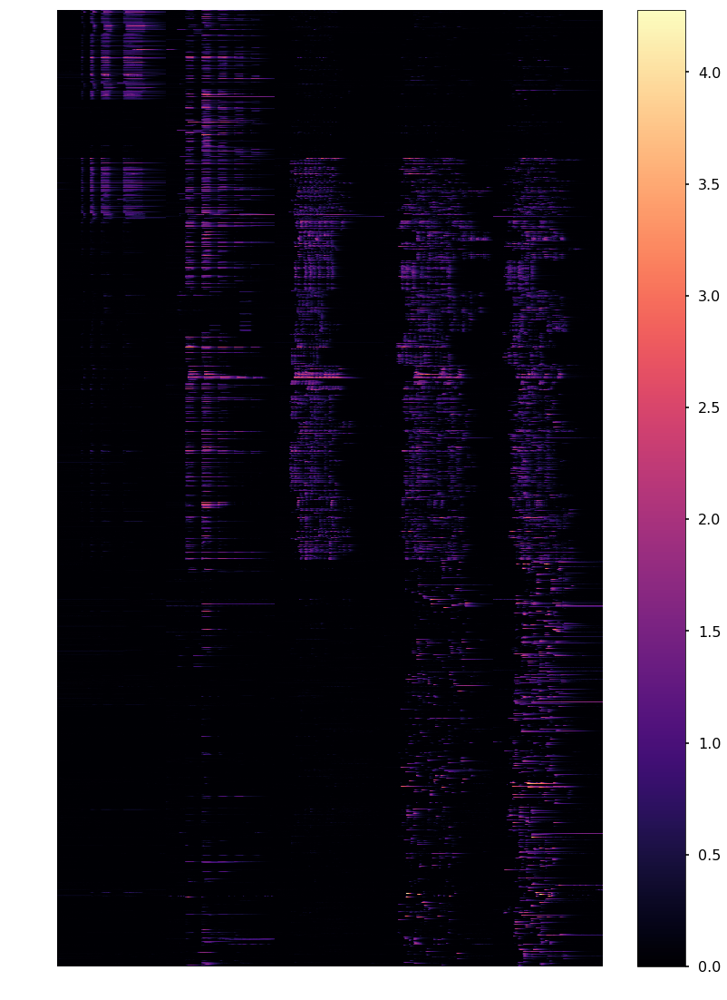

In [87]:
stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']
profiles = ['htspec','brush','brushpuff','vibration','airpuff']

alltraces_wt_norm = show_traces(wt_norm,stimlist,profiles=profiles,dropna=True,\
                           title='',vmin=0,vmax=None)
#plt.savefig('wt-5stimuli.png',transparent = True,dpi=400)

In [88]:
#number of cells displayed for each category
wt_df.loc[alltraces_wt_norm.index,:].groupby('profile').agg('count')['genotype']

profile
airpuff      172
brush        653
brushpuff    120
htspec       783
vibration    112
Name: genotype, dtype: int64

In [89]:
# total number of cells in figure 2
wt_df.loc[alltraces_wt_norm.index,:].groupby('profile').agg('count')['genotype'].sum()

1840

In [90]:
#number of ganglia/animals in figure 2
len(wt_df.loc[alltraces_wt_norm.index,'ganglion'].unique())

23

## Display heatmaps by cell class (figure 4 and S4)

C1/2 :  2
C3 :  178
C4 :  250
C5 :  147
C6 :  135
C7/8/9/10 :  38
C11/12 :  76
C13 :  149


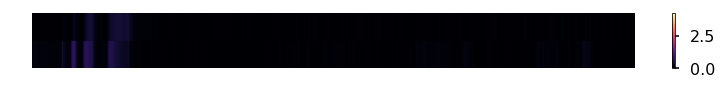

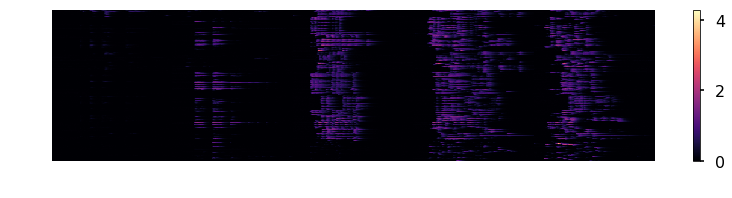

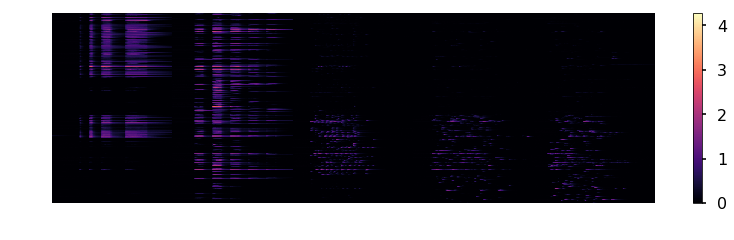

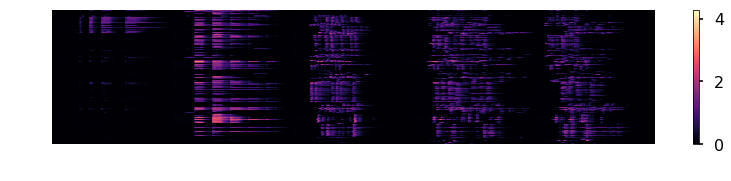

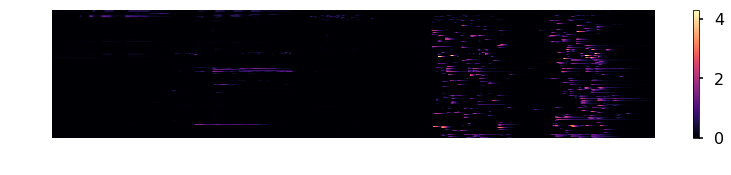

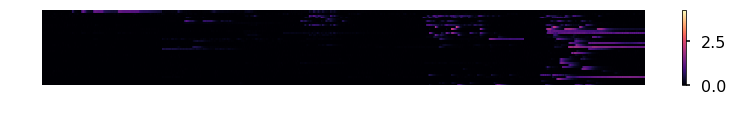

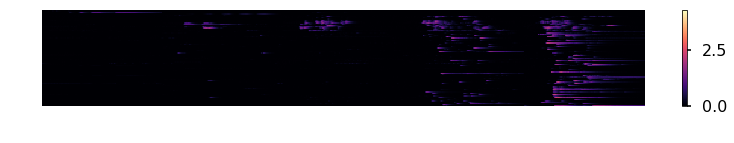

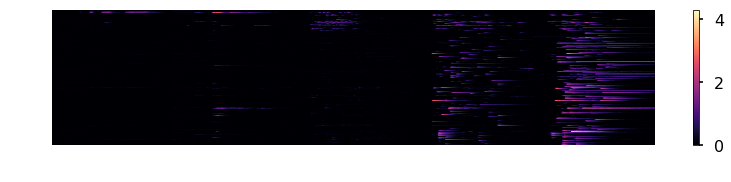

In [91]:
stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']
profiles = ['htspec','brush','brushpuff','vibration','airpuff']
vmin = 0
vmax = alltraces_wt_norm.max().max()
for c in cell_classes:
    t = show_traces(wt_norm.loc[wt_norm['class']==c,:],stimlist,profiles=profiles,dropna=True,\
                    vmin=vmin,vmax=vmax,title=c)
    print(c, ": ",t.shape[0])
    c = c.replace('/','')
    #plt.savefig('wt-'+c+'-heatmap.png',transparent=True,dpi=400)

## Display heatmaps of ko animals (normalized to median pinch)

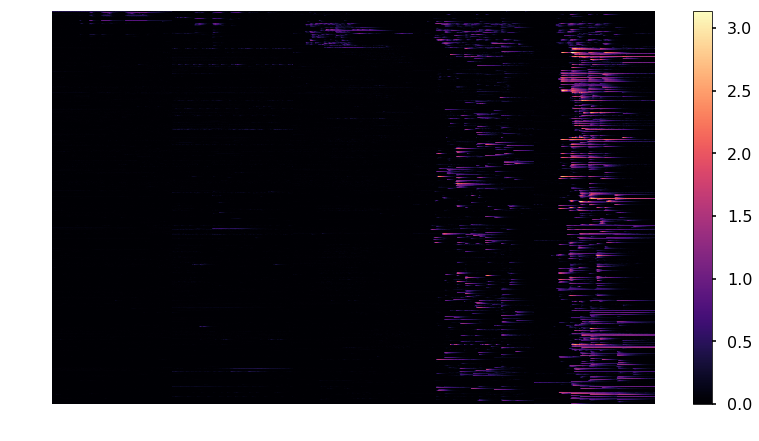

In [92]:
stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']
profiles = ['htspec','brush','brushpuff','vibration','airpuff']

alltraces_ko = show_traces(ko_norm,stimlist,profiles=profiles,dropna=True,\
                           title='Knockout all mechanosensory cells',vmin=0,vmax=None)
#plt.savefig('ko-5stimuli.png',transparent = True,dpi=400)

## Display heatmaps of ko by cell class (figure 6 and 7)

C3 :  93
C4 :  23
C5 :  18
C6 :  53
C7/8/9/10 :  24
C11/12 :  57
C13 :  260


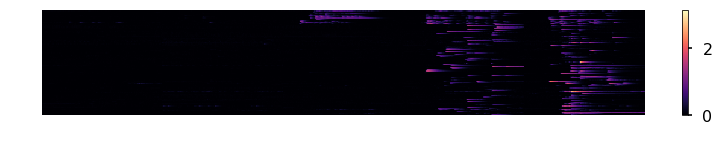

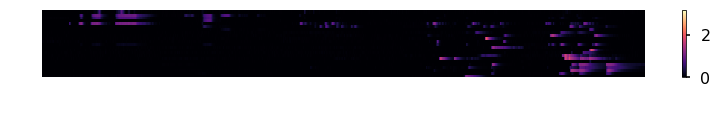

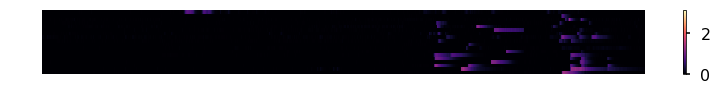

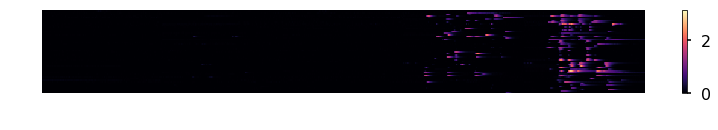

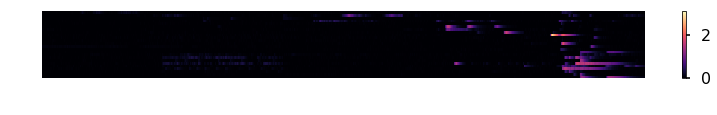

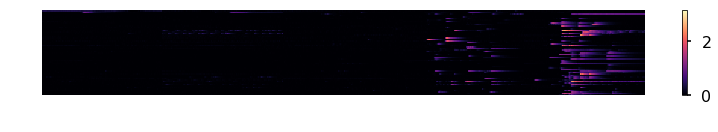

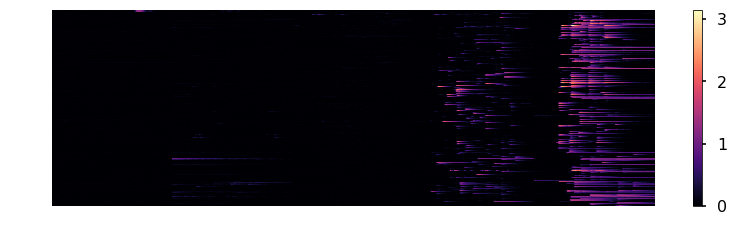

In [93]:
stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']
profiles = ['htspec','brush','brushpuff','vibration','airpuff']
vmin = 0
vmax = alltraces_ko.max().max()
for c in cell_classes[1:]:
    t = show_traces(ko_norm.loc[ko_norm['class']==c,:],stimlist,profiles=profiles,dropna=True,\
                    vmin=vmin,vmax=vmax,title=c)
    print(c, ": ",t.shape[0])
    c = c.replace('/','')
    #plt.savefig('ko-'+c+'-heatmap.png',transparent=True,dpi=400)

## example traces for different profiles

airpuff

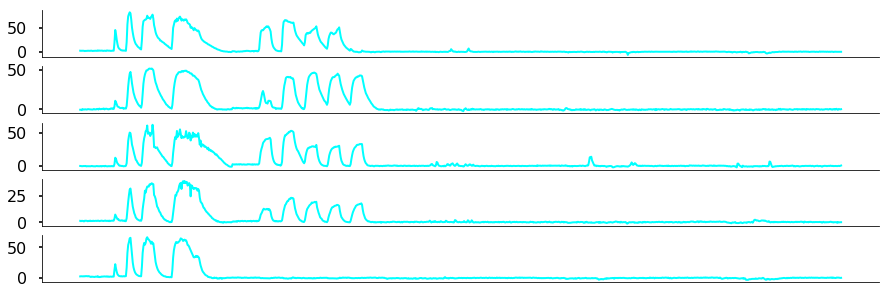

In [94]:
idcs = ['20190423-1278-0395','20190930-1066-0410','20190423-1418-0306','20190423-1729-0469','20190430-0590-0924']
tmp = wt_df[wt_df.profile=='airpuff'].loc[idcs,:]

stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']

plot_single_traces(tmp,colors=['cyan',] * len(tmp),stimuli=stimlist,axis=True,label=False,height=1,linewidth=2,alpha=1)
sns.despine();
#plt.savefig('sample_airpuff_traces.svg',transparent=True)


vibration

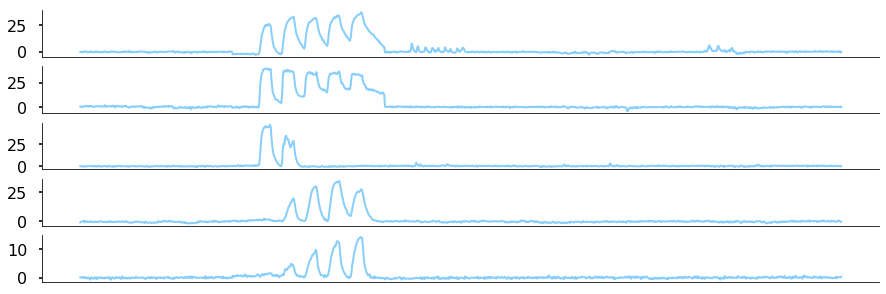

In [95]:
idcs = ['20190913-0565-1067','20190423-1173-0478','20190507-1053-0472','20190806-0660-0608','20190719-0688-1497']
tmp = wt_df[wt_df.profile=='vibration'].loc[idcs,:]
stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']

plot_single_traces(tmp,colors=['lightskyblue',] * len(tmp),stimuli=stimlist,axis=True,label=False,height=1,linewidth=2,alpha=1)
sns.despine();
#plt.savefig('sample_vibration_traces.svg',transparent=True)


mixed responders (aka 'brushpuff')

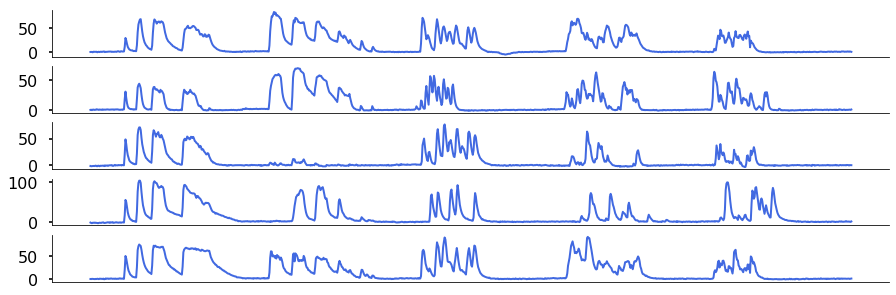

In [96]:
idcs = ['20190913-0824-0627','20190719-0821-1123','20190913-0356-1273','20191008-0436-0363','20190913-1097-0148']
tmp = wt_df[wt_df.profile=='brushpuff'].loc[idcs,:]
stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']

plot_single_traces(tmp,colors=['royalblue',] * len(tmp),stimuli=stimlist,axis=True,label=False,height=1,linewidth=2,alpha=1)
sns.despine();
#plt.savefig('sample_brushpuff_traces.svg',transparent=True)


brush cells

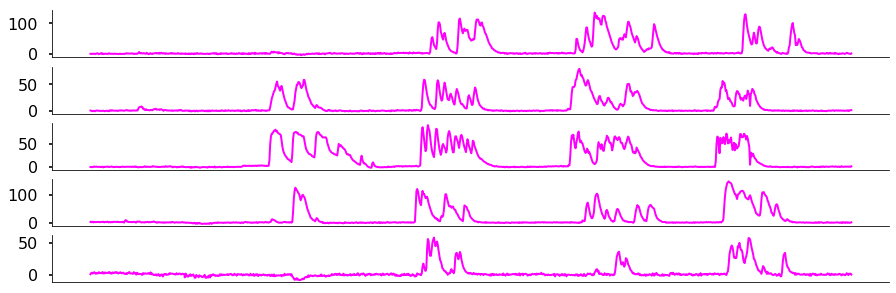

In [97]:
b_idcs= ['20200313R-0479-0217','20190913-0805-0507','20190913-0543-1036','20200320BL-1392-0374','20200320BL-0172-0400']
tmp = wt_df[wt_df.profile=='brush'].loc[b_idcs,:]

stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']

plot_single_traces(tmp,colors=['magenta',] * len(tmp),stimuli=stimlist,axis=True,label=False,height=1,linewidth=2,alpha=1)
sns.despine();
#plt.savefig('sample_brush_traces.svg',transparent=True)


ht cells

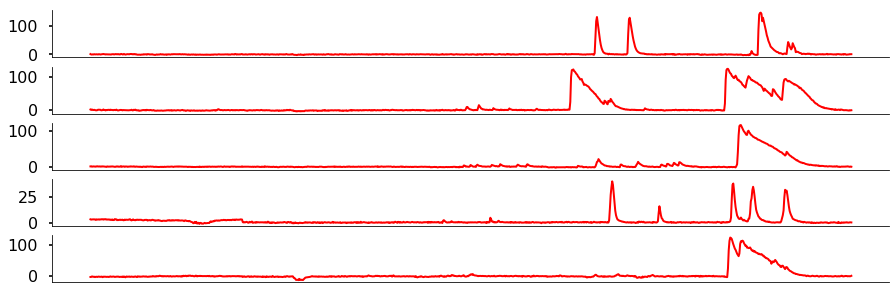

In [180]:
ht_idcs = ['20200313R-0886-0238','20190930-0876-0432', '20191004-1342-0635','20200320BR-1452-0115','20200320BL-0879-0266']
tmp = wt_df[wt_df.profile=='htspec'].loc[ht_idcs,:]

stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']

plot_single_traces(tmp,colors=['red',] * len(tmp),stimuli=stimlist,axis=True,label=False,height=1,linewidth=2,alpha=1)
sns.despine();
#plt.savefig('sample_htspec_traces.svg',transparent=True)

## percentages of cell classes in wildtype and knock-out

In [98]:
def get_percentages(df):
    n_pos = df[['C1/2','C3','C4','C5','C6','C7/8/9/10','C11/12','C13']].sum(axis=0).fillna(0).astype('uint16')
    n_tested = np.sum(~df[['C1/2','C3','C4','C5','C6','C7/8/9/10','C11/12','C13']].isnull(),axis=0).fillna(0).astype('uint16')    
    percentages = n_pos/n_tested
    
    result = pd.DataFrame({'positive':n_pos,'tested':n_tested,'percentage':percentages})  
    #result[['positive','tested']] = result[['positive','tested']].astype(np.uint16)
    result['text'] = result.apply(lambda row: '{:.0f}/{:.0f}'.format(row['positive'], row['tested']), axis=1)
    
    #display(result[['text','percentage']]) 
    
    return result
    


wildtype

In [99]:
display(get_percentages(wt_df))


,percentage,positive,tested,text
C1/2,0.004032,2,496,2/496
C3,0.193707,197,1017,197/1017
C4,0.265675,250,941,250/941
C5,0.111190,156,1403,156/1403
C6,0.122951,135,1098,135/1098
C7/8/9/10,0.041339,42,1016,42/1016
C11/12,0.080000,80,1000,80/1000
C13,0.171518,165,962,165/962


knock-out

In [100]:
display(get_percentages(ko_df))

,percentage,positive,tested,text
C1/2,NaN,0,0,0/0
C3,0.210623,115,546,115/546
C4,0.046642,25,536,25/536
C5,0.038961,21,539,21/539
C6,0.097595,69,707,69/707
C7/8/9/10,0.054004,29,537,29/537
C11/12,0.133581,72,539,72/539
C13,0.404696,293,724,293/724


## Percentages split by functional category (wildtype)

In [101]:
display(get_percentages(wt_df.loc[wt_df.profile == 'airpuff',:]))
display(get_percentages(wt_df.loc[wt_df.profile == 'vibration',:]))
display(get_percentages(wt_df.loc[wt_df.profile == 'brushpuff',:]))
display(get_percentages(wt_df.loc[wt_df.profile == 'brush',:]))
display(get_percentages(wt_df.loc[wt_df.profile == 'htspec',:]))

,percentage,positive,tested,text
C1/2,0.051282,2,39,2/39
C3,0.000000,0,100,0/100
C4,0.934066,85,91,85/91
C5,0.007463,1,134,1/134
C6,0.025210,3,119,3/119
C7/8/9/10,0.010000,1,100,1/100
C11/12,0.034091,3,88,3/88
C13,0.022222,2,90,2/90


,percentage,positive,tested,text
C1/2,0.000000,0,23,0/23
C3,0.000000,0,42,0/42
C4,0.923077,48,52,48/52
C5,0.059701,4,67,4/67
C6,0.016667,1,60,1/60
C7/8/9/10,0.000000,0,41,0/41
C11/12,0.024390,1,41,1/41
C13,0.000000,0,38,0/38


,percentage,positive,tested,text
C1/2,0.000000,0,32,0/32
C3,0.135593,8,59,8/59
C4,0.534483,31,58,31/58
C5,0.256098,21,82,21/82
C6,0.026667,2,75,2/75
C7/8/9/10,0.016949,1,59,1/59
C11/12,0.000000,0,61,0/61
C13,0.053571,3,56,3/56


,percentage,positive,tested,text
C1/2,0.000000,0,167,0/167
C3,0.463977,161,347,161/347
C4,0.134454,48,357,48/357
C5,0.244856,119,486,119/486
C6,0.012407,5,403,5/403
C7/8/9/10,0.023055,8,347,8/347
C11/12,0.038043,14,368,14/368
C13,0.072626,26,358,26/358


,percentage,positive,tested,text
C1/2,0.000000,0,235,0/235
C3,0.059701,28,469,28/469
C4,0.099217,38,383,38/383
C5,0.017350,11,634,11/634
C6,0.281179,124,441,124/441
C7/8/9/10,0.068230,32,469,32/469
C11/12,0.140271,62,442,62/442
C13,0.319048,134,420,134/420


## Graphs for percentages (wildtype)

In [104]:
perc = wt_df.groupby(['profile']).apply(get_percentages)
perc = perc.reset_index().rename(columns={'level_1':'class'})
perc_by_ganglion = wt_df.groupby(['profile','ganglion']).apply(get_percentages)
perc_by_ganglion = perc_by_ganglion.reset_index().rename(columns={'level_2':'class'})


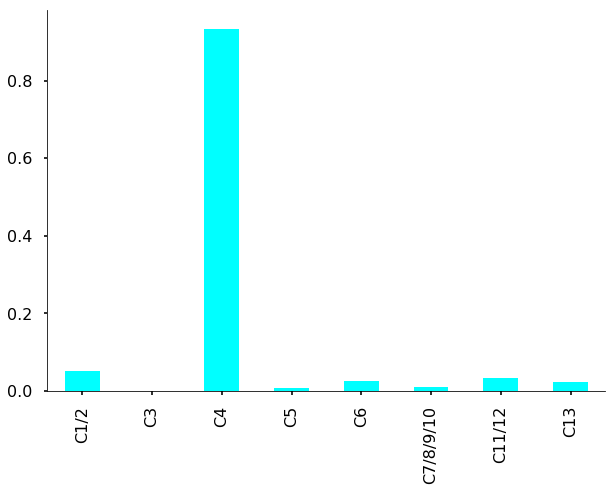

In [106]:
perc.loc[perc.profile=='airpuff','percentage'].plot.bar(figsize=(10,7),color='cyan')
plt.xticks([x for x in range(8)],labels = cell_classes)
sns.despine();
#plt.savefig('barchart-airpuff.svg',transparent=True)

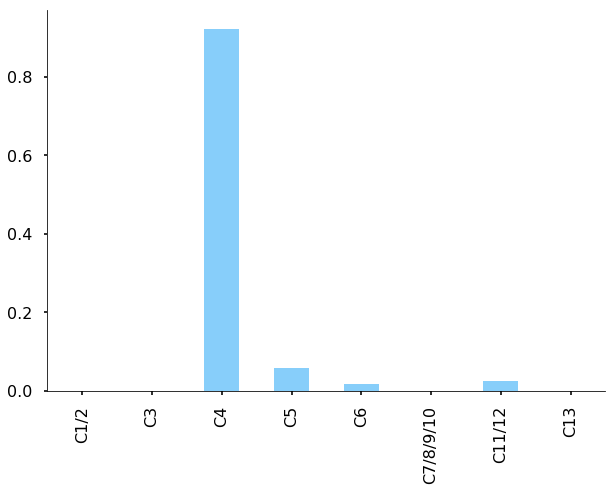

In [107]:
perc.loc[perc.profile=='vibration','percentage'].plot.bar(figsize=(10,7),color='lightskyblue')
plt.xticks([x for x in range(8)],labels = cell_classes)
sns.despine();
#plt.savefig('barchart-vibration.svg',transparent=True)

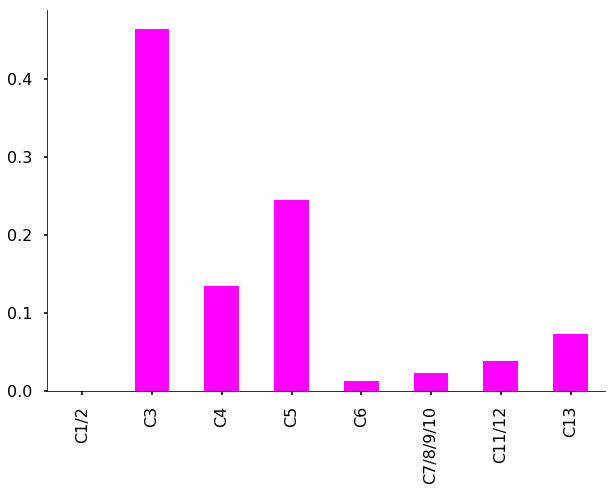

In [108]:
perc.loc[perc.profile=='brush','percentage'].plot.bar(figsize=(10,7),color='magenta')
plt.xticks([x for x in range(8)],labels = cell_classes)
sns.despine();
#plt.savefig('barchart-brush.svg',transparent=True)

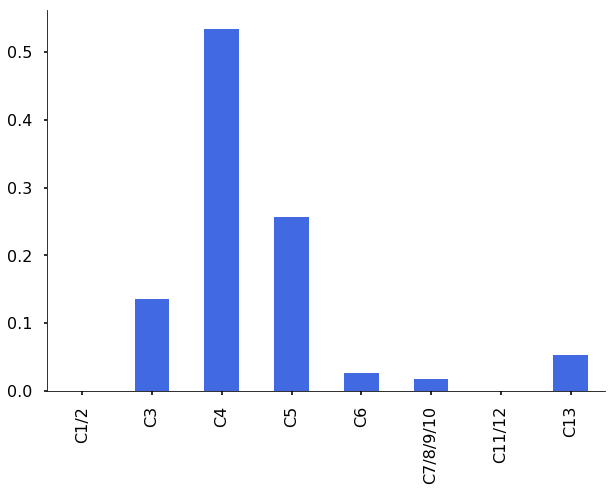

In [109]:
perc.loc[perc.profile=='brushpuff','percentage'].plot.bar(figsize=(10,7),color='royalblue')
plt.xticks([x for x in range(8)],labels = cell_classes)
sns.despine();
#plt.savefig('barchart-brushpuff.svg',transparent=True)

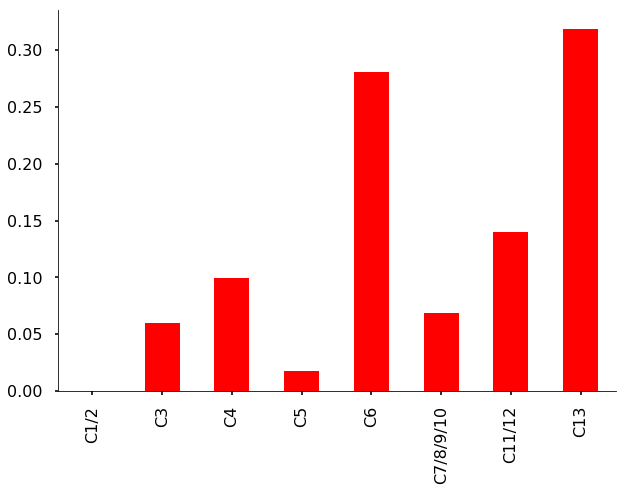

In [110]:
perc.loc[perc.profile=='htspec','percentage'].plot.bar(figsize=(10,7),color=['red'])
plt.xticks([x for x in range(8)],labels = cell_classes)
sns.despine();
#plt.savefig('barchart-HTMR.svg',transparent=True)

## Stacked bar charts for percentages (wt)

In [172]:
# stacked charts
cell_classes = ['C1/2','C3','C4','C5','C6','C7/8/9/10','C11/12','C13']
profiles = ['airpuff','vibration','brushpuff','brush','htspec'][::-1]
tmp = wt_df.groupby('class')['profile'].value_counts().unstack(level=-1).fillna(0).loc[cell_classes,profiles]
htspec_wt = pd.DataFrame(tmp['htspec']).T

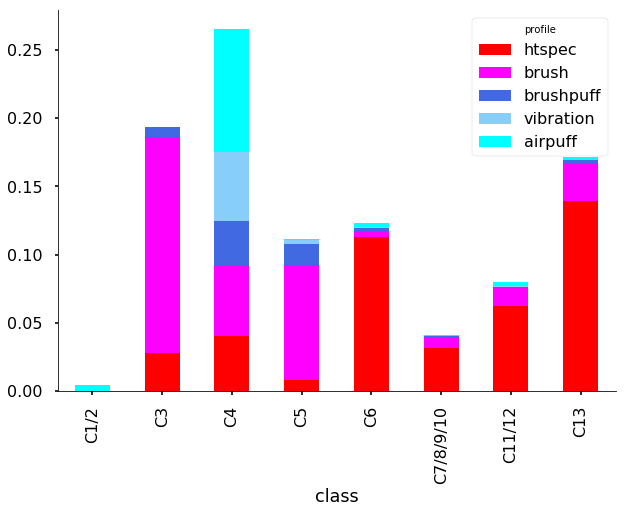

In [112]:
table = tmp.copy()
table['total'] = tmp.sum(axis=1)
table['tested'] = np.sum(~wt_df[['C1/2','C3','C4','C5','C6','C7/8/9/10','C11/12','C13']].isnull(),axis=0).fillna(0).astype('uint16') 
table =table.div(table.loc[:,'tested'],axis=0)
wt_table = table[['htspec','brush','brushpuff','vibration','airpuff']]
wt_table.plot.bar(stacked=True, color=['red','magenta','royalblue','lightskyblue','cyan'], figsize=(10,7));
sns.despine()
#plt.savefig('stackedbarchart_by_class.svg',transparent=True)

In [113]:
wt_bars = table[['airpuff','vibration','brushpuff','brush','htspec']].sum(axis=1)
wt_bars = pd.DataFrame(wt_bars/wt_bars['C13'],columns=['value'])
wt_bars['genotype'] = 'wt'

### Stacked bar charts for percentages (ko)

In [114]:
# stacked charts
cell_classes = ['C1/2','C3','C4','C5','C6','C7/8/9/10','C11/12','C13']
profiles = ['airpuff','vibration','brushpuff','brush','htspec'][::-1]
tmp = ko_df.groupby('class')['profile'].value_counts().unstack(level=-1).fillna(0).loc[cell_classes[1:],profiles]
htspec_ko = pd.DataFrame(tmp['htspec']).T

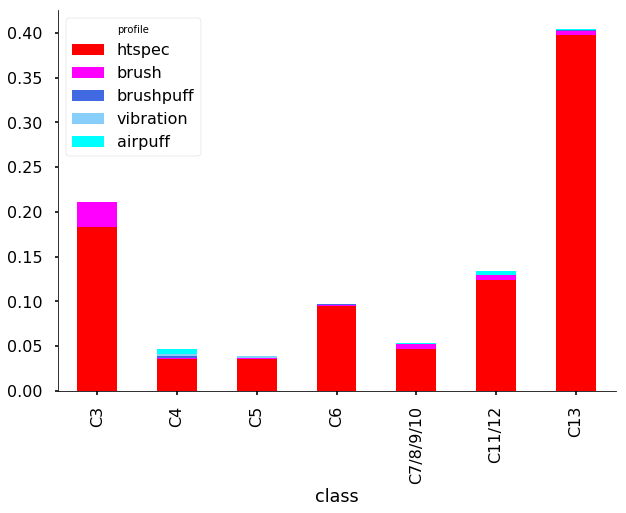

In [115]:
table = tmp.copy()
table['total'] = tmp.sum(axis=1)
table['tested'] = np.sum(~ko_df[cell_classes[1:]].isnull(),axis=0).fillna(0).astype('uint16') 
table =table.div(table.loc[:,'tested'],axis=0)
ko_table = table[['htspec','brush','brushpuff','vibration','airpuff']]
ko_table.plot.bar(stacked=True, color=['red','magenta','royalblue','lightskyblue','cyan'], figsize=(10,7));
sns.despine()
plt.savefig('ko_stackedbarchart_by_class.svg',transparent=True)

In [116]:
wt_table['genotype'] = 'wt'
wt_table = wt_table.drop('C1/2')
ko_table['genotype'] = 'ko'


/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


## Grouped stacked barchart to compare wt and ko

In [117]:
dfall = pd.concat([pd.melt(i.reset_index(),
                           id_vars=["genotype", "class"]) # transform in tidy format each df
                   for i in [wt_table,ko_table]],
                   ignore_index=True)
dfall.set_index(["genotype", "class", "profile"], inplace=True)
dfall
dfall["vcs"] = dfall.groupby(level=["genotype", "class"]).cumsum()
dfall.reset_index(inplace=True) 

In [119]:

le = pd.concat([htspec_wt,htspec_ko],axis=0).fillna(0)
le.index = ['wt','ko']
le = le.div(le.sum(axis=1),axis=0)
le


,C1/2,C11/12,C13,C3,C4,C5,C6,C7/8/9/10
wt,0.0,0.144522,0.312354,0.065268,0.088578,0.025641,0.289044,0.074592
ko,0.0,0.114530,0.492308,0.170940,0.032479,0.032479,0.114530,0.042735


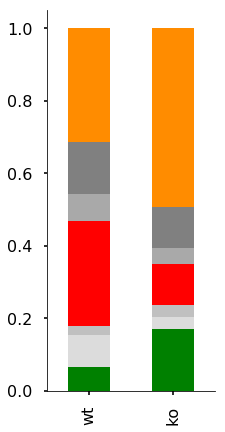

In [120]:
le = le.loc[:,cell_classes]
class_to_color =  {'nd':'gray','C3':'green','C13':'darkorange','C11/12':'gray','C7/8/9/10':'darkgray','C1/2':'cyan','C4':'gainsboro','C5':'silver','C6':'red'}
colors = [class_to_color[c] for c in le.columns]
le.plot.bar(stacked=True, figsize=(3,7),color=colors);
plt.gca().get_legend().remove()
sns.despine()
#plt.savefig('le.svg',transparent=True)

## Timecourse of responses

In [121]:

    
def draw_endtraces(df,ax,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,**kwargs):

    result = []
    filt = np.array([1,1,1,-1,-1,-1])
    
    for row in df.iterrows():
        trace = row[1]['traces'][stim]
        #normalize
        trace = [x/max(trace) for x in trace]
        #derivative
        
        deriv = np.convolve(np.array(trace),filt,mode='same')
        index = find_peaks(deriv,height=height,distance=distance)[0][-1]
        if trace[index-5]< 0.1:
            ys = trace[index-10:]
            ys = [y/max(ys) for y in ys]
            result.append(ys)
            
    #max_length = max([len(x) for x in result])
    #result = np.array([xi+[None]*(max_length-len(xi)) for xi in result])
    
    filtered_result = []
    for trace in result:
        if len(trace)>40:
            deriv = np.convolve(np.array(trace), filt, mode='same')[20:]
            if deriv.max() < filterheight:
                filtered_result.append(trace)
                            
    for trace in filtered_result:
        ax.plot(trace,**kwargs)
        
def draw_endtraces_log(df,ax,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,**kwargs):

    result = []
    filt = np.array([1,1,1,-1,-1,-1])
    
    for row in df.iterrows():
        trace = row[1]['traces'][stim]
        #normalize
        trace = [x/max(trace) for x in trace]
        #derivative
        
        deriv = np.convolve(np.array(trace),filt,mode='same')
        index = find_peaks(deriv,height=height,distance=distance)[0][-1]
        if trace[index-5]< 0.1:
            ys = trace[index-10:]
            ys = [y/max(ys) for y in ys]
            result.append(ys)
            
    #max_length = max([len(x) for x in result])
    #result = np.array([xi+[None]*(max_length-len(xi)) for xi in result])
    
    filtered_result = []
    for trace in result:
        if len(trace)>40:
            deriv = np.convolve(np.array(trace), filt, mode='same')[20:]
            if deriv.max() < filterheight:
                filtered_result.append(trace)
                            
    for trace in filtered_result:
        ax.plot(np.log(trace),**kwargs)
      

def draw_avg_endtrace(df,ax,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,**kwargs):

    result = []
    filt = np.array([1,1,1,-1,-1,-1])
    
    for row in df.iterrows():
        trace = row[1]['traces'][stim]
        #normalize
        trace = [x/max(trace) for x in trace]
        #derivative
        
        deriv = np.convolve(np.array(trace),filt,mode='same')
        index = find_peaks(deriv,height=height,distance=distance)[0][-1]
        if trace[index-5]< 0.1:
            ys = trace[index-10:]
            ys = [y/max(ys) for y in ys]
            result.append(ys)
            
    #max_length = max([len(x) for x in result])
    #result = np.array([xi+[None]*(max_length-len(xi)) for xi in result])
    
    filtered_result = []
    for trace in result:
        if len(trace)>40:
            deriv = np.convolve(np.array(trace), filt, mode='same')[20:]
            if deriv.max() < filterheight:
                filtered_result.append(trace)
    
    max_length = max([len(x) for x in filtered_result])
    filtered_result = np.array([xi+[None]*(max_length-len(xi)) for xi in filtered_result], dtype=np.float)
    ax.plot(np.nanmean(filtered_result,axis=0),**kwargs)
    


## Compare C3, C4, C5 brush responses

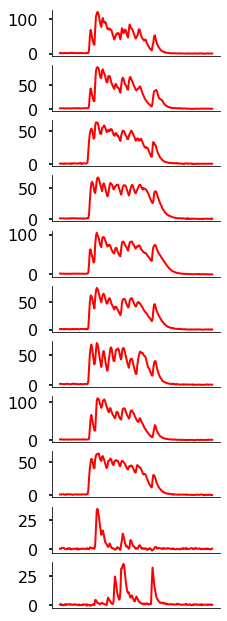

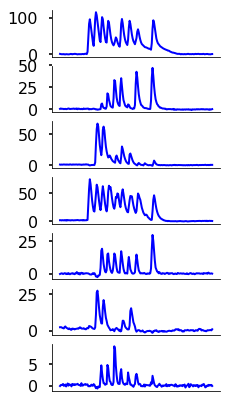

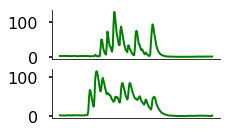

In [171]:
g = wt_df.groupby('ganglion').get_group('20190806')
    
stimlist = ['brush_with']

C3 = g[np.logical_and.reduce((g['profile'] == 'brush',g['class']=='C3',g['MAX_brush_with']>1))]
C4 = g[np.logical_and.reduce((g['profile'] == 'brush',g['class']=='C4',g['MAX_brush_with']>1))]
C5 = g[np.logical_and.reduce((g['profile'] == 'brush',g['class']=='C5',g['MAX_brush_with']>1))]



plot_single_traces(C3,colors=['red',] * len(C3),stimuli=stimlist,axis=True,height=1,linewidth=2,alpha=1)
sns.despine();
#plt.savefig('C3brushtraces.svg',transparent=True)

plot_single_traces(C4,colors=['blue',] * len(C4),stimuli=stimlist,axis=True,height=1,linewidth=2,alpha=1)
#plt.title(name);
sns.despine();
#plt.savefig('C4brushtraces.svg',transparent=True)

plot_single_traces(C5,colors=['green',] * len(C5),stimuli=stimlist,axis=True,height=1,linewidth=2,alpha=1)
#plt.title(name);
sns.despine();
#plt.savefig('C5brushtraces.svg',transparent=True)

## Plot timecourse of C6 vs C13 cells

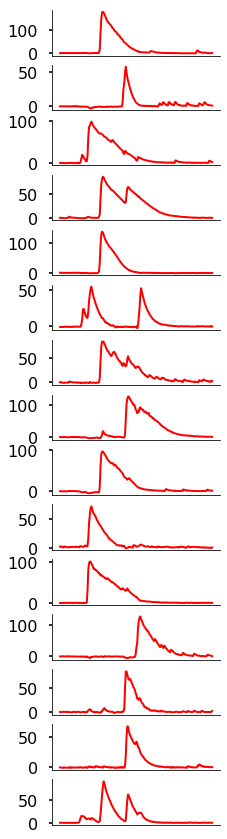

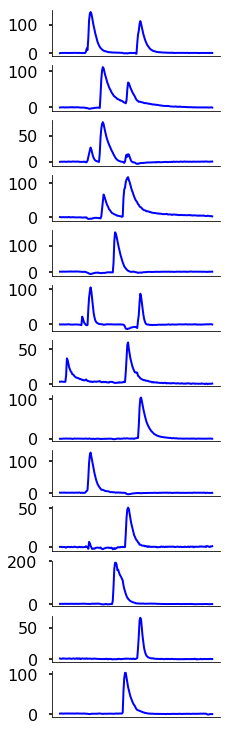

In [124]:
g = wt_df.groupby('ganglion').get_group('20190806')
    
stimlist = ['pinch1']

C6 = g[np.logical_and.reduce((g['profile'] == 'htspec',g['class']=='C6',g['MAX_pinch1']>50))]
C13 = g[np.logical_and.reduce((g['profile'] == 'htspec',g['class']=='C13',g['MAX_pinch1']>50))]

plot_single_traces(C13,colors=['red',] * len(C13),stimuli=stimlist,axis=True,height=1,linewidth=2,alpha=1)
sns.despine();
#plt.savefig('C13traces.svg',transparent=True)

plot_single_traces(C6,colors=['blue',] * len(C6),stimuli=stimlist,axis=True,height=1,linewidth=2,alpha=1)
sns.despine();
#plt.savefig('C6traces.svg',transparent=True)

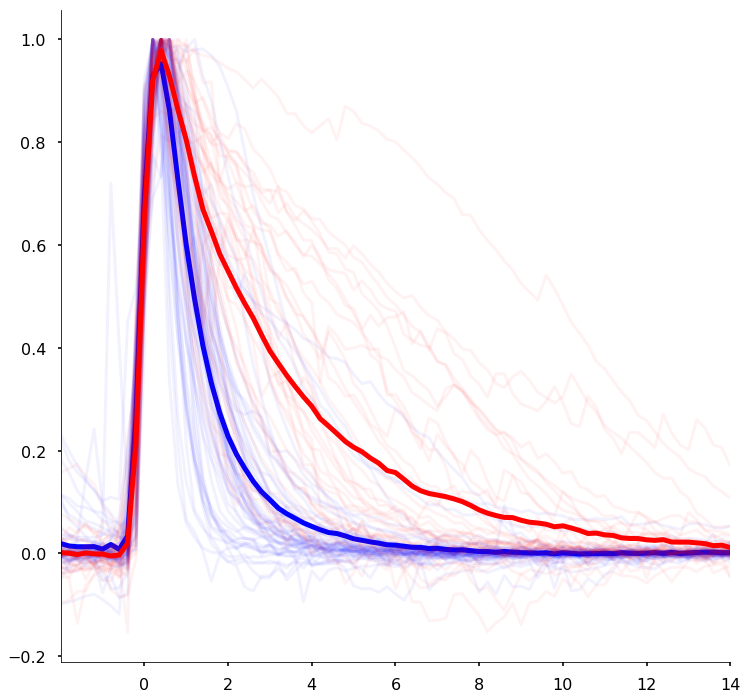

In [125]:
C13_cells = wt_df[np.logical_and(wt_df.profile=='htspec',wt_df['class']=='C13')]
C6_cells = wt_df[np.logical_and(wt_df.profile=='htspec',wt_df['class']=='C6')]
C3_cells = wt_df[np.logical_and(wt_df.profile=='brush',wt_df['class']=='C3')]

plt.figure(figsize=(12,12))
ax = plt.gca()
draw_endtraces(C6_cells,ax=ax,color='blue',height = 0.2, filterheight = 0.15,distance = 60,linewidth=3,alpha=0.05)
draw_avg_endtrace(C6_cells,ax=ax,color='blue',height = 0.2, filterheight = 0.15,distance = 60,linewidth=5,alpha=1)
draw_endtraces(C13_cells,ax=ax,color='red',height = 0.2, filterheight = 0.15,distance = 60,linewidth=3,alpha=0.05)
draw_avg_endtrace(C13_cells,ax=ax,color='red',height = 0.2, filterheight = 0.15,distance = 60,linewidth=5,alpha=1)

plt.xlim((0,80))
plt.xticks([10,20,30,40,50,60,70,80],[0,2,4,6,8,10,12,14])
sns.despine()
#plt.savefig('C6vsC13_lastpinch.svg',transparent='True')

## Calculate mean lifetime tau

In [127]:
from sklearn.linear_model import LinearRegression


## functions to synchronize last peak of a stimulus
def get_endtraces(df,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,start=0):
    result = []
    filt = np.array([1,1,1,-1,-1,-1])
    
    for row in df.iterrows():
        trace = row[1]['traces'][stim]
        #normalize
        trace = [x/max(trace) for x in trace]
        #derivative
        
        deriv = np.convolve(np.array(trace),filt,mode='same')
        index = find_peaks(deriv,height=height,distance=distance)[0][-1]
        if trace[index-5]< 0.1:
            ys = trace[index+start:]
            ys = [y/max(ys) for y in ys]
            result.append(ys)
            
    #max_length = max([len(x) for x in result])
    #result = np.array([xi+[None]*(max_length-len(xi)) for xi in result])
    
    filtered_result = []
    for trace in result:
        if len(trace)>40:
            deriv = np.convolve(np.array(trace), filt, mode='same')[20:]
            if deriv.max() < filterheight:
                filtered_result.append(trace)
    return filtered_result

def crop_endtrace(trace,threshold=0.1):
    end = next((i for i, j in enumerate(trace) if j<threshold), None) 
    start = next((i for i, j in enumerate(trace) if j==1.), None) 
    
    return trace[start:end]

def get_lifetime(trace):
    log_trace = np.log(trace)
    x = np.array([i for i in range(len(trace))]).reshape(-1, 1)
    reg = LinearRegression(fit_intercept=False).fit(x, log_trace)
    return -1./reg.coef_[0]

def lifetime_from_df(df,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,threshold=0.1):
    endtraces = get_endtraces(df,stim,height, filterheight,distance,start=0) # list of lists
    lifetimes = []
    for endtrace in endtraces:
        endtrace = crop_endtrace(endtrace,threshold)
        lifetimes.append(get_lifetime(endtrace))
    return lifetimes

def lifetime_from_avg(df,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,threshold=0.1):
    endtraces = get_endtraces(df,stim,height, filterheight,distance,start=0) # list of lists

    max_length = max([len(x) for x in endtraces])
    endtraces = np.array([xi+[None]*(max_length-len(xi)) for xi in endtraces], dtype=np.float)
    avg_trace = np.nanmean(endtraces,axis=0)
    avg_trace = crop_endtrace(avg_trace,threshold)
    return get_lifetime(avg_trace)

In [128]:
from scipy.stats import sem
# work on exponential decay
C13_cells = wt_df[np.logical_and(wt_df.profile=='htspec',wt_df['class']=='C13')]
C6_cells = wt_df[np.logical_and(wt_df.profile=='htspec',wt_df['class']=='C6')]


C13_lifetimes = lifetime_from_df(C13_cells,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,threshold=0.1)
C6_lifetimes = lifetime_from_df(C6_cells,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,threshold=0.1)
print(np.mean(C6_lifetimes),sem(C6_lifetimes))
print(np.mean(C13_lifetimes),sem(C13_lifetimes))
print(ttest_ind(C6_lifetimes,C13_lifetimes,nan_policy='omit',equal_var=False))

print(lifetime_from_avg(C6_cells,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,threshold=0.1))
print(lifetime_from_avg(C13_cells,stim = 'pinch1',height = 0.3, filterheight = 0.1,distance = 20,threshold=0.1))


/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/sklearn/linear_model/base.py:509: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  linalg.lstsq(X, y)


6.683618026395178 0.4987437406983142
15.604096075249421 1.9780487136464748
Ttest_indResult(statistic=-4.37287685960352, pvalue=0.0001240322687103102)
7.810120761134887
16.95724281152689


## Significance of percentages between animals

brush cells

In [129]:
tmp = wt_df.copy()
tmp.loc[tmp.profile != 'brush','profile'] = 'nonbrush'
brush_vs_nonbrush = tmp.groupby(['profile','ganglion']).apply(get_percentages)
brush_vs_nonbrush = brush_vs_nonbrush.reset_index().rename(columns={'level_2':'class'})


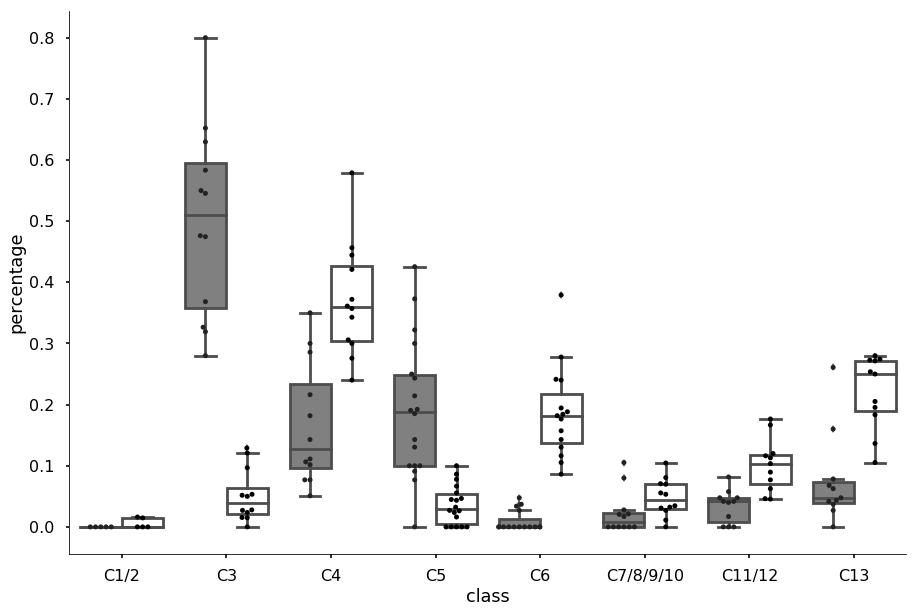

In [130]:
plt.figure(figsize=[15,10])
sns.boxplot(x="class", y="percentage", hue="profile", hue_order=['brush','nonbrush'], palette = ['gray','white'], data=brush_vs_nonbrush,order=cell_classes)
sns.swarmplot(x="class", y="percentage", hue="profile",hue_order=['brush','nonbrush'],data=brush_vs_nonbrush, color='black', dodge=True,order=cell_classes);
plt.gca().get_legend().remove()
sns.despine();
#plt.savefig('brush_vs_nonbrush.svg',transparent=True)

In [131]:
brush = brush_vs_nonbrush[brush_vs_nonbrush.profile == 'brush'].pivot(index='ganglion',columns='class')['percentage']
nonbrush = brush_vs_nonbrush[brush_vs_nonbrush.profile == 'nonbrush'].pivot(index='ganglion',columns='class')['percentage']

In [132]:
# this is Welch's t-test for unequal variance or sample size, not sure if this is right with holm-sidak correction for multiple test
pd.Series(multipletests(ttest_ind(brush,nonbrush,nan_policy='omit',equal_var=False).pvalue.tolist(),method = 'hs')[1],\
          index=brush.columns)

class
C1/2         0.178414
C11/12       0.001318
C13          0.000260
C3           0.000003
C4           0.000164
C5           0.000102
C6           0.000001
C7/8/9/10    0.145391
dtype: float64

airpuff cells

In [133]:
tmp = wt_df.copy()
tmp.loc[tmp.profile != 'airpuff','profile'] = 'nonpuff'
puff_vs_nonpuff = tmp.groupby(['profile','ganglion']).apply(get_percentages)
puff_vs_nonpuff = puff_vs_nonpuff.reset_index().rename(columns={'level_2':'class'})


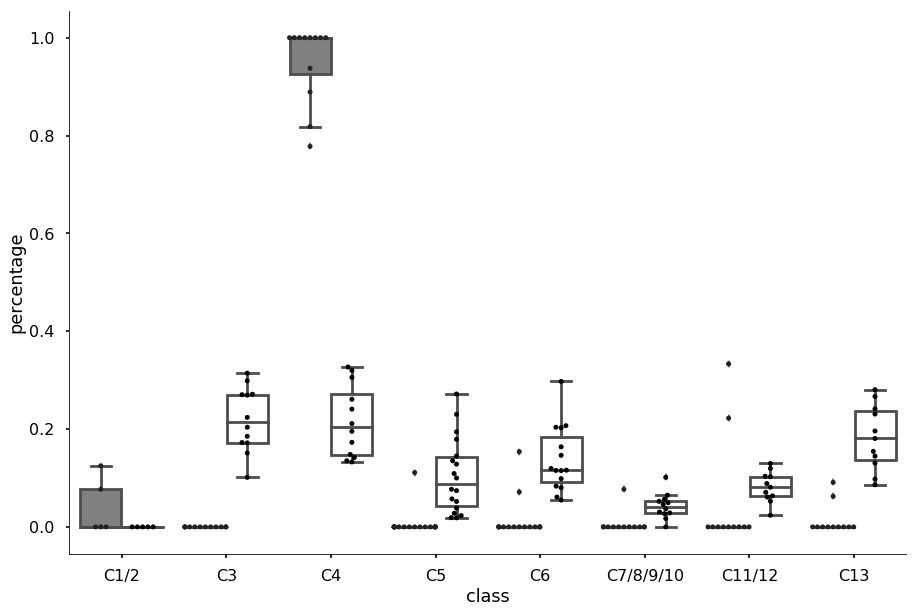

In [134]:
plt.figure(figsize=[15,10])
sns.boxplot(x="class", y="percentage", hue="profile", hue_order=['airpuff','nonpuff'], palette = ['gray','white'], data=puff_vs_nonpuff,order=cell_classes)
#.index.get_level_values(0)
sns.swarmplot(x="class", y="percentage", hue="profile",hue_order=['airpuff','nonpuff'],data=puff_vs_nonpuff, color='black', dodge=True,order=cell_classes);
plt.gca().get_legend().remove()
sns.despine();
#plt.savefig('airpuff_vs_nonpuff.svg',transparent=True)

In [136]:
puff = puff_vs_nonpuff[puff_vs_nonpuff.profile == 'airpuff'].pivot(index='ganglion',columns='class')['percentage']
nonpuff = puff_vs_nonpuff[puff_vs_nonpuff.profile == 'nonpuff'].pivot(index='ganglion',columns='class')['percentage']

In [137]:
# this is Welch's t-test for unequal variance with Holm-Sidak correction
pd.Series(multipletests(ttest_ind(puff,nonpuff,nan_policy='omit',equal_var=False).pvalue.tolist(),method = 'hs')[1],\
          index=puff.columns)

class
C1/2         3.496624e-01
C11/12       4.065068e-01
C13          1.272170e-05
C3           1.201781e-06
C4           8.881784e-16
C5           1.618720e-04
C6           1.714671e-05
C7/8/9/10    4.156005e-03
dtype: float64

vibration cells

In [139]:
tmp = wt_df.copy()
tmp.loc[tmp.profile != 'vibration','profile'] = 'nonvib'
vib_vs_nonvib = tmp.groupby(['profile','ganglion']).apply(get_percentages)
vib_vs_nonvib = vib_vs_nonvib.reset_index().rename(columns={'level_2':'class'})


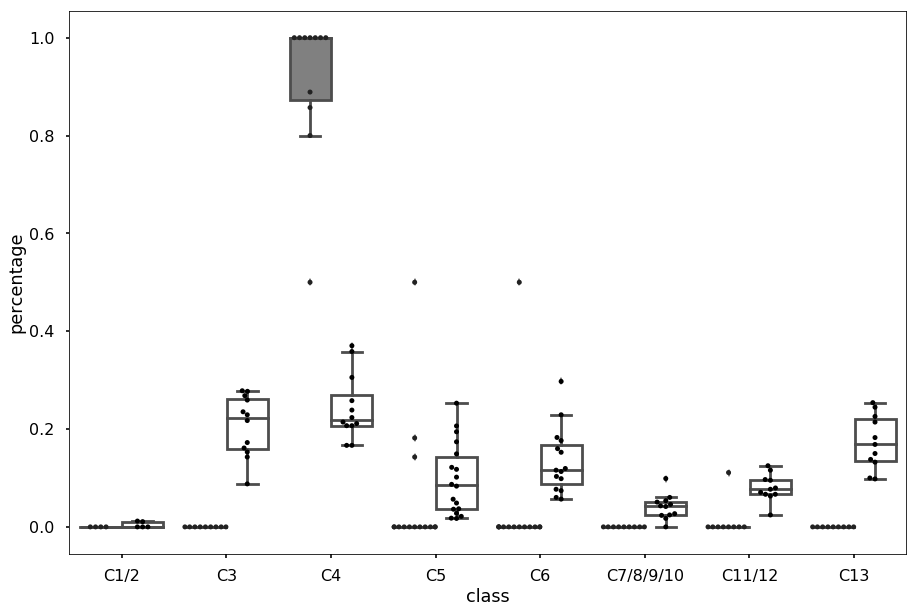

In [140]:
plt.figure(figsize=[15,10])
sns.boxplot(x="class", y="percentage", hue="profile", hue_order=['vibration','nonvib'], palette = ['gray','white'], data=vib_vs_nonvib,order=cell_classes)
sns.swarmplot(x="class", y="percentage", hue="profile",hue_order=['vibration','nonvib'],data=vib_vs_nonvib, color='black', dodge=True,order=cell_classes);
plt.gca().get_legend().remove()

#plt.savefig('vibe_vs_nonvibe.svg',transparent=True)

In [141]:
vib = vib_vs_nonvib[vib_vs_nonvib.profile == 'vibration'].pivot(index='ganglion',columns='class')['percentage']
nonvib = vib_vs_nonvib[vib_vs_nonvib.profile == 'nonvib'].pivot(index='ganglion',columns='class')['percentage']

In [142]:
# this is Welch's t-test for unequal variance with Holm-Sidak correction
pd.Series(multipletests(ttest_ind(vib,nonvib,nan_policy='omit',equal_var=False).pvalue.tolist(),method = 'hs')[1],\
          index=vib.columns)

class
C1/2         3.252082e-01
C11/12       1.666525e-03
C13          6.700815e-06
C3           1.207604e-06
C4           3.559475e-08
C5           3.632663e-01
C6           1.047171e-01
C7/8/9/10    8.509242e-04
dtype: float64

HT cells

In [143]:
tmp = wt_df.copy()
tmp.loc[tmp.profile != 'htspec','profile'] = 'nonht'
ht_vs_nonht = tmp.groupby(['profile','ganglion']).apply(get_percentages)
ht_vs_nonht = ht_vs_nonht.reset_index().rename(columns={'level_2':'class'})


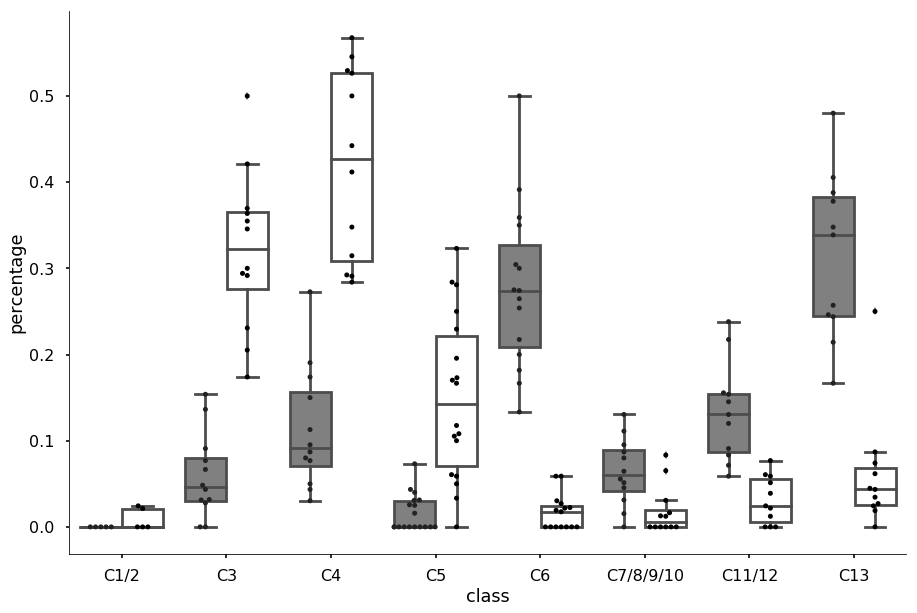

In [144]:
plt.figure(figsize=[15,10])
sns.boxplot(x="class", y="percentage", hue="profile", hue_order=['htspec','nonht'], palette = ['gray','white'], data=ht_vs_nonht,order=cell_classes)
sns.swarmplot(x="class", y="percentage", hue="profile",hue_order=['htspec','nonht'],data=ht_vs_nonht, color='black', dodge=True,order=cell_classes);
plt.gca().get_legend().remove()
sns.despine();
#plt.savefig('ht_vs_nonht.svg',transparent=True)

In [145]:
ht = ht_vs_nonht[ht_vs_nonht.profile == 'htspec'].pivot(index='ganglion',columns='class')['percentage']
nonht = ht_vs_nonht[ht_vs_nonht.profile == 'nonht'].pivot(index='ganglion',columns='class')['percentage']

In [146]:
# this is Welch's t-test for unequal variance with Holm-Sidak correction
pd.Series(multipletests(ttest_ind(ht,nonht,nan_policy='omit',equal_var=False).pvalue.tolist(),method = 'hs')[1],\
          index=brush.columns)

class
C1/2         1.791283e-01
C11/12       3.067922e-04
C13          5.281193e-06
C3           8.959940e-07
C4           9.630046e-07
C5           5.322500e-05
C6           2.173564e-07
C7/8/9/10    7.167399e-03
dtype: float64

mixed responders

In [147]:
tmp = wt_df.copy()
tmp.loc[tmp.profile != 'brushpuff','profile'] = 'nonmixed'
mixed_vs_nonmixed = tmp.groupby(['profile','ganglion']).apply(get_percentages)
mixed_vs_nonmixed = mixed_vs_nonmixed.reset_index().rename(columns={'level_2':'class'})


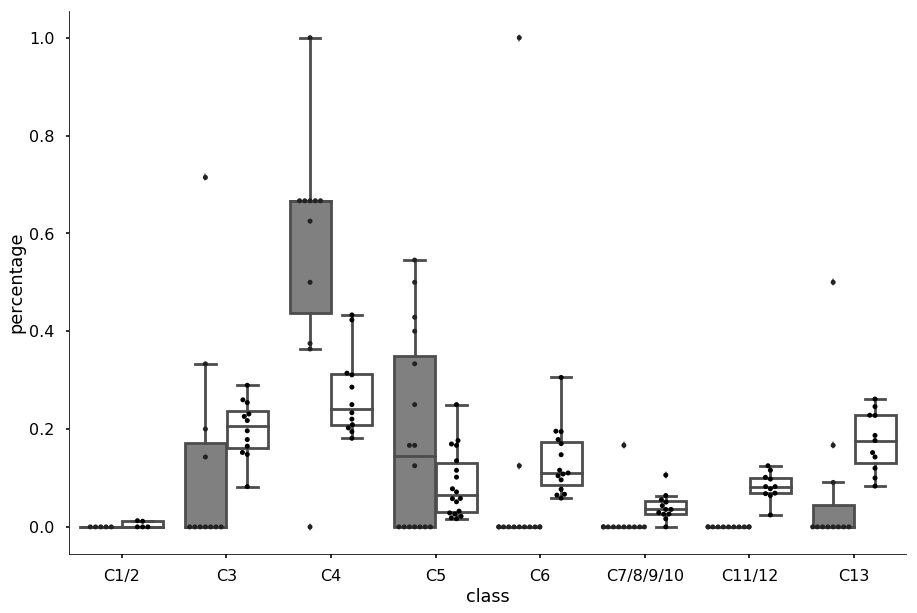

In [148]:
plt.figure(figsize=[15,10])
sns.boxplot(x="class", y="percentage", hue="profile", hue_order=['brushpuff','nonmixed'], palette = ['gray','white'], data=mixed_vs_nonmixed,order=cell_classes)
sns.swarmplot(x="class", y="percentage", hue="profile",hue_order=['brushpuff','nonmixed'],data=mixed_vs_nonmixed, color='black', dodge=True,order=cell_classes);
plt.gca().get_legend().remove()
sns.despine();
#plt.savefig('mixed_vs_nonmixed.svg',transparent=True)

In [149]:
mixed = mixed_vs_nonmixed[mixed_vs_nonmixed.profile == 'brushpuff'].pivot(index='ganglion',columns='class')['percentage']
nonmixed = mixed_vs_nonmixed[mixed_vs_nonmixed.profile == 'nonmixed'].pivot(index='ganglion',columns='class')['percentage']

In [59]:
# this is Welch's t-test for unequal variance with Holm-Sidak correction
pd.Series(multipletests(ttest_ind(mixed,nonmixed,nan_policy='omit',equal_var=False).pvalue.tolist(),method = 'hs')[1],\
          index=mixed.columns)

class
C1/2         0.486227
C11/12       0.000014
C13          0.273579
C3           0.529755
C4           0.023753
C5           0.372643
C6           0.564857
C7/8/9/10    0.486227
dtype: float64

# Knock-out analysis of cell percentages

In [363]:
ko_profiles = mechano.groupby(['genotype','ganglion']).apply(lambda x:x.profile.value_counts()/len(x))
ko_profiles = ko_profiles.reset_index().rename(columns={'level_2':'profile','profile':'percentage'})
genotypes = ko_profiles.genotype
ko_profiles = ko_profiles.pivot(columns='profile',index='ganglion')
ko_profiles['genotype'] = ko_profiles['genotype']['htspec']
ko_profiles = ko_profiles.fillna(0).stack().reset_index()


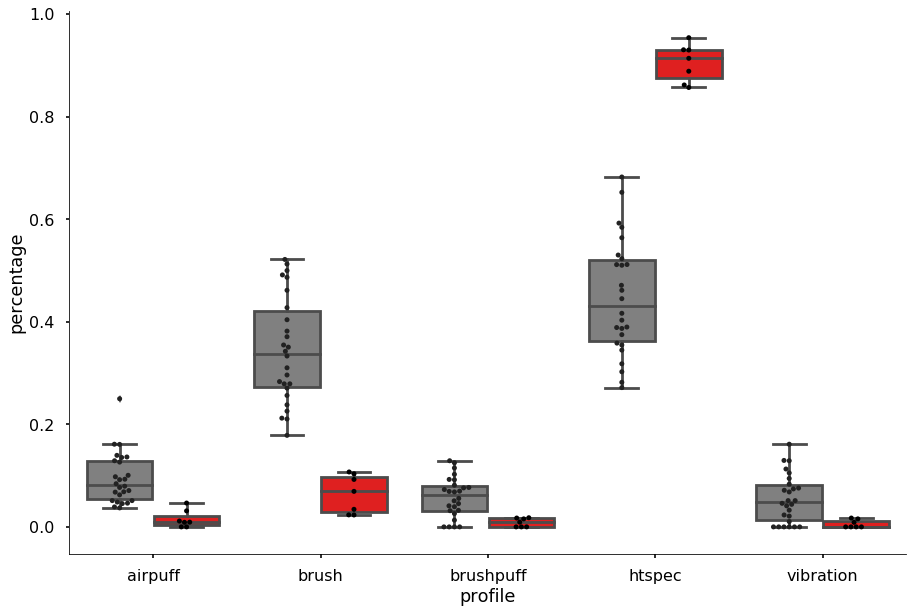

In [364]:
plt.figure(figsize=[15,10])
sns.boxplot(x="profile", y="percentage", hue="genotype", hue_order=['Tac1tagRFP','Piezo2ko'], palette = ['gray','red'], data=ko_profiles)
sns.swarmplot(x="profile", y="percentage", hue="genotype",hue_order=['Tac1tagRFP','Piezo2ko'],data=ko_profiles, color='black', dodge=True);
plt.gca().get_legend().remove()
sns.despine();
#plt.savefig('ko_profiles_boxplot.svg',transparent=True)

In [365]:
a = ko_profiles[ko_profiles.genotype == 'Piezo2ko'].pivot(index='ganglion',columns='profile')['percentage']
b = ko_profiles[ko_profiles.genotype == 'Tac1tagRFP'].pivot(index='ganglion',columns='profile')['percentage']

In [366]:
pd.Series(multipletests(ttest_ind(a,b,nan_policy='omit',equal_var=False).pvalue.tolist(),method = 'hs')[1],\
          index=a.columns)

profile
airpuff      6.943947e-07
brush        2.566480e-11
brushpuff    2.747069e-06
htspec       0.000000e+00
vibration    2.143965e-05
dtype: float64

In [367]:
perc = mechano.groupby(['genotype','ganglion']).apply(get_percentages)
perc = perc.reset_index().rename(columns={'level_2':'class'})


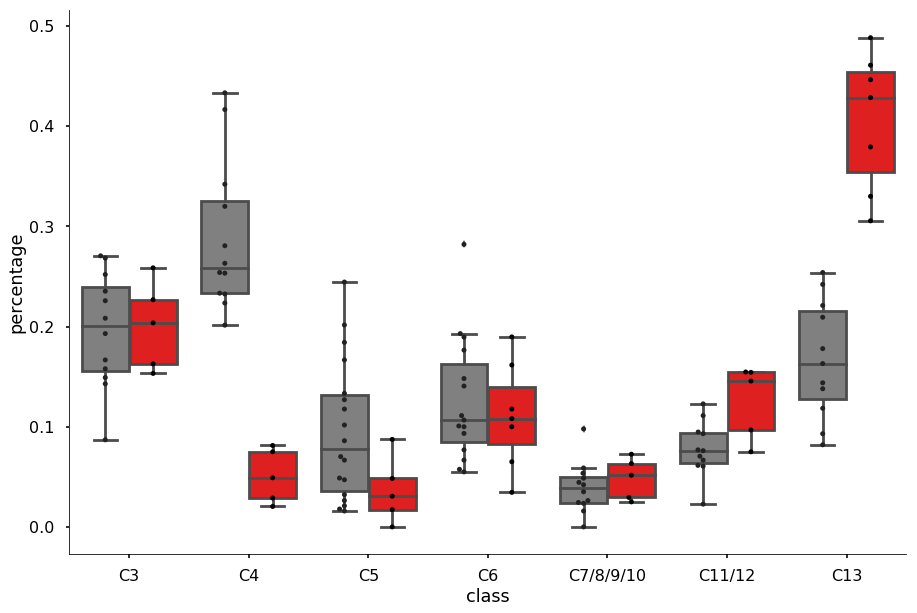

In [368]:
plt.figure(figsize=[15,10])
sns.boxplot(x="class", y="percentage", hue="genotype", hue_order=['Tac1tagRFP','Piezo2ko'], palette = ['gray','red'], data=perc,order=cell_classes[1:])
#.index.get_level_values(0)
sns.swarmplot(x="class", y="percentage", hue="genotype",hue_order=['Tac1tagRFP','Piezo2ko'],data=perc, color='black', dodge=True,order=cell_classes[1:]);
plt.gca().get_legend().remove()

sns.despine();
#plt.savefig('ko_allprofiles_byclass.svg',transparent=True)

In [370]:
a = perc[perc.genotype == 'Piezo2ko'].pivot(index='ganglion',columns='class')['percentage'][cell_classes[1:]]
b = perc[perc.genotype == 'Tac1tagRFP'].pivot(index='ganglion',columns='class')['percentage'][cell_classes[1:]]

In [371]:
pd.Series(multipletests(ttest_ind(a,b,nan_policy='omit',equal_var=False).pvalue.tolist(),method = 'hs')[1],\
          index=a.columns)

class
C3           8.603264e-01
C4           6.886873e-07
C5           9.412413e-02
C6           8.397680e-01
C7/8/9/10    8.397680e-01
C11/12       1.575881e-01
C13          5.544238e-05
dtype: float64

In [374]:
perc_brush = mechano.loc[mechano.profile=='brush',:].groupby(['genotype','ganglion']).apply(get_percentages)
perc_brush = perc_brush.reset_index().rename(columns={'level_2':'class'})


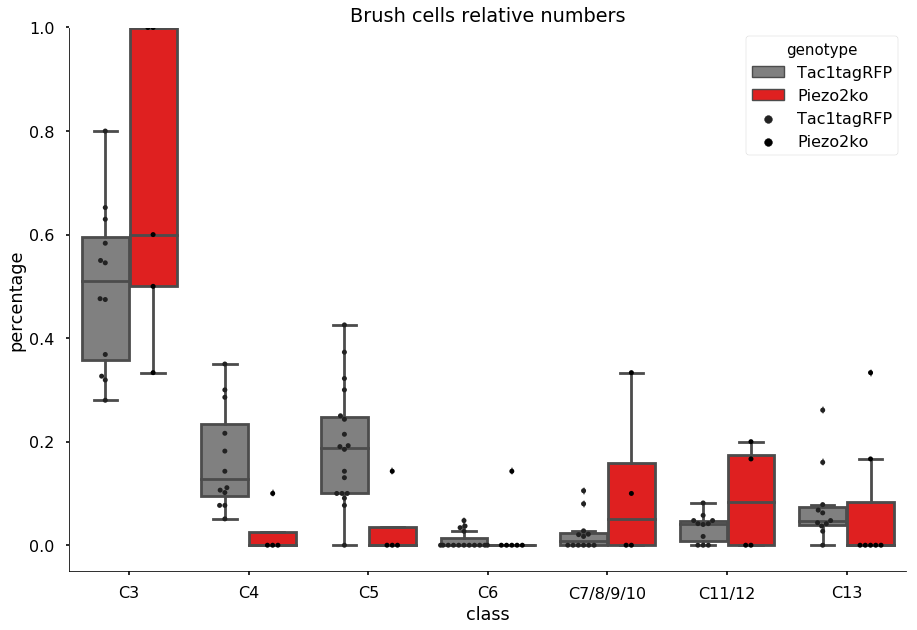

In [376]:
plt.figure(figsize=[15,10])
sns.boxplot(x="class", y="percentage", hue="genotype", hue_order=['Tac1tagRFP','Piezo2ko'], palette = ['gray','red'], data=perc_brush,order=cell_classes[1:])
#.index.get_level_values(0)
sns.swarmplot(x="class", y="percentage", hue="genotype",hue_order=['Tac1tagRFP','Piezo2ko'],data=perc_brush, color='black', dodge=True,order=cell_classes[1:]);
ax = plt.gca()
ax.set_ylim(-0.05, 1);
plt.title('Brush cells relative numbers')
sns.despine();

In [379]:
perc_htspec = mechano.loc[mechano.profile=='htspec',:].groupby(['genotype','ganglion']).apply(get_percentages)
perc_htspec = perc_htspec.reset_index().rename(columns={'level_2':'class'})


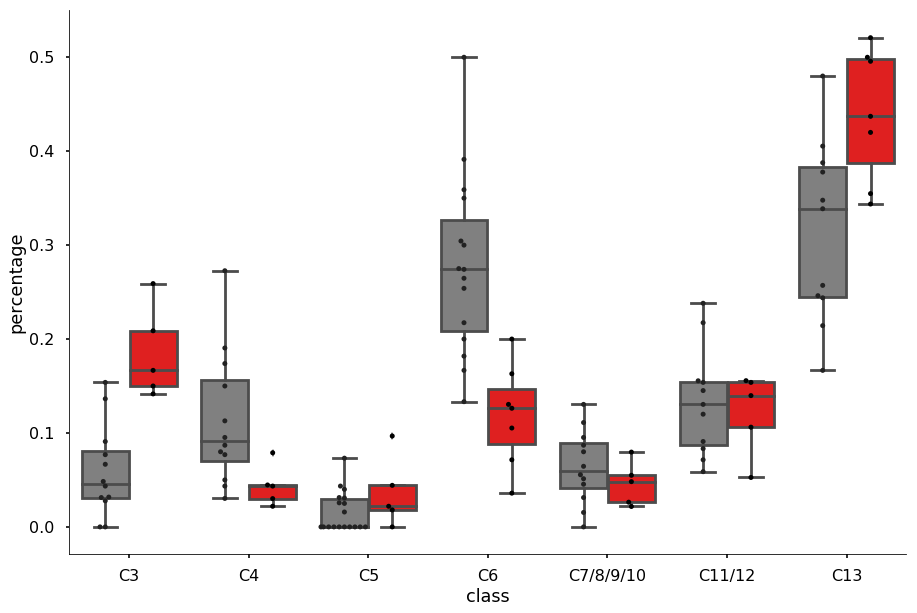

In [380]:
plt.figure(figsize=[15,10])
sns.boxplot(x="class", y="percentage", hue="genotype", hue_order=['Tac1tagRFP','Piezo2ko'], palette = ['gray','red'], data=perc_htspec,order=cell_classes[1:])
#.index.get_level_values(0)
sns.swarmplot(x="class", y="percentage", hue="genotype",hue_order=['Tac1tagRFP','Piezo2ko'],data=perc_htspec, color='black', dodge=True,order=cell_classes[1:]);
plt.gca().get_legend().remove()

sns.despine();
plt.savefig('ko_ht_byclass.svg',transparent=True)

In [381]:
perc_htspec_ko = perc_htspec[perc_htspec.genotype == 'Piezo2ko'].pivot(index='ganglion',columns='class')['percentage']
perc_htspec_wt = perc_htspec[perc_htspec.genotype == 'Tac1tagRFP'].pivot(index='ganglion',columns='class')['percentage']

In [382]:
# with holm-sidak
pd.Series(multipletests(ttest_ind(perc_htspec_wt,perc_htspec_ko,nan_policy='omit',equal_var=False).pvalue.tolist()[1:],method = 'hs')[1],\
          index=perc_htspec_wt.columns[1:])

class
C11/12       0.666050
C13          0.031897
C3           0.008736
C4           0.031897
C5           0.607703
C6           0.000654
C7/8/9/10    0.607703
dtype: float64

## analysis of high threshold / low threshold response ratios between wt and ko

In [150]:
mechano['RATIO_log_ht_lt'] = np.log(1/mechano['RATIO_lt_ht'])

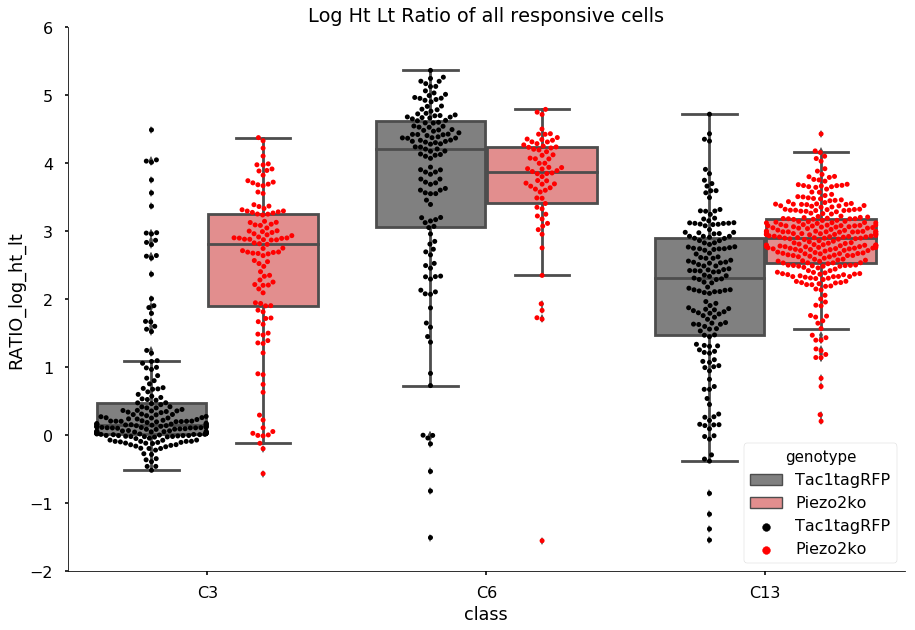

In [151]:
plt.figure(figsize=[15,10])
sns.boxplot(x="class", y="RATIO_log_ht_lt", hue="genotype", hue_order=['Tac1tagRFP','Piezo2ko'], palette = ['gray','lightcoral'], data=mechano[mechano['class'] != 'nd'],order = ['C3','C6','C13'])
#.index.get_level_values(0)
sns.swarmplot(x="class", y="RATIO_log_ht_lt", hue="genotype",hue_order=['Tac1tagRFP','Piezo2ko'],data=mechano[mechano['class'] != 'nd'], palette=['black','red'], dodge=True,order = ['C3','C6','C13']);
ax = plt.gca()
ax.set_ylim(-2, 6);
plt.title('Log Ht Lt Ratio of all responsive cells')
sns.despine();
#plt.savefig('loghtltratio_ko.svg',transparent=True)

In [152]:
loghtlt_ko = mechano[mechano.genotype == 'Piezo2ko'].pivot(columns='class')['RATIO_log_ht_lt'][cell_classes[1:]]
loghtlt_wt = mechano[mechano.genotype == 'Tac1tagRFP'].pivot(columns='class')['RATIO_log_ht_lt'][cell_classes[1:]]

In [153]:
# this is significance across all responsive cellse

pd.Series(multipletests(ttest_ind(loghtlt_wt,loghtlt_ko,nan_policy='omit',equal_var=True).pvalue.tolist(),method = 'hs')[1],\
          index=loghtlt_wt.columns)

class
C3           0.000000e+00
C4           8.592052e-09
C5           0.000000e+00
C6           9.609670e-01
C7/8/9/10    6.812656e-01
C11/12       6.812656e-01
C13          9.992007e-15
dtype: float64

## Calb2 cells

percentage of airpuff cells that are calb2 + (uncurated)

In [160]:
np.sum(wt_df.loc[wt_df.profile == 'airpuff','ISH_calb2'])/len(wt_df.loc[np.logical_and(wt_df.profile == 'airpuff',~(wt_df['ISH_calb2'].isnull()))])

0.2857142857142857

In [161]:
#percentage of calb2 cells responding to airpuff and/or vibration
34/37

0.918918918918919

In [165]:
calb2_cells = wt_df.loc[np.logical_and(wt_df.ISH_calb2 > 0,wt_df.STAT_max>10)]

(37, 1000)


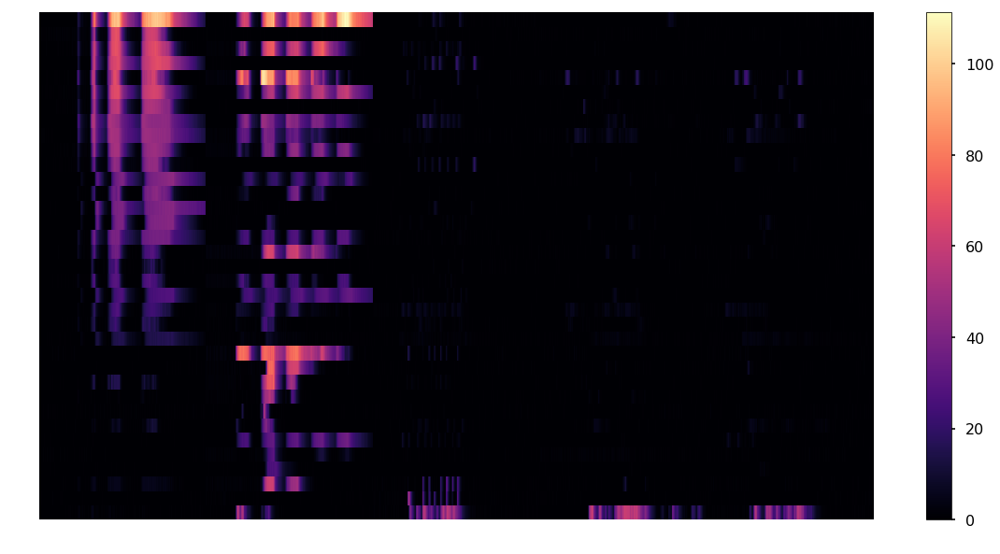

In [169]:

calb2_airpuff = calb2_cells[calb2_cells.profile == 'airpuff'].sort_values('MAX_airpuff',ascending=True)[1:]
calb2_vibration = calb2_cells[calb2_cells.profile == 'vibration'].sort_values('MAX_vibration',ascending=True)
calb2_brushpuff = calb2_cells[calb2_cells.profile == 'brushpuff']
calb2_brush = calb2_cells[calb2_cells.profile == 'brush'].sort_values('MAX_brush_with',ascending=False)

df = pd.concat([calb2_brush,calb2_vibration,calb2_airpuff,calb2_brushpuff])

stimuli = STANDARD_STIM
figsize=(20,10)
vmin=0
vmax = None
cmap = 'magma'      
        
frames = []
for stim in stimuli:
    frame = df.apply(lambda row: pd.Series(row['traces'][stim] if (stim in row['traces'].keys()) else [np.nan,]*200),axis=1)
    frames.append(frame)
result = pd.concat(frames,axis=1)

print(result.shape)
fig = plt.figure(figsize=figsize)
plt.set_cmap("magma")


ax = plt.gca()


masked_data = np.ma.masked_invalid(result)

if vmin is None:
    vmin=np.nanmin(masked_data)
if vmax is None:
    vmax=np.nanmax(masked_data)
heatmap = ax.pcolor(masked_data[1:-1], cmap=cmap, 
                vmin=vmin, vmax=vmax)
ax.patch.set_color('black')
fig.colorbar(heatmap);
plt.axis('off');
#plt.savefig('calb2_lars.png',transparent=True,dpi=400)

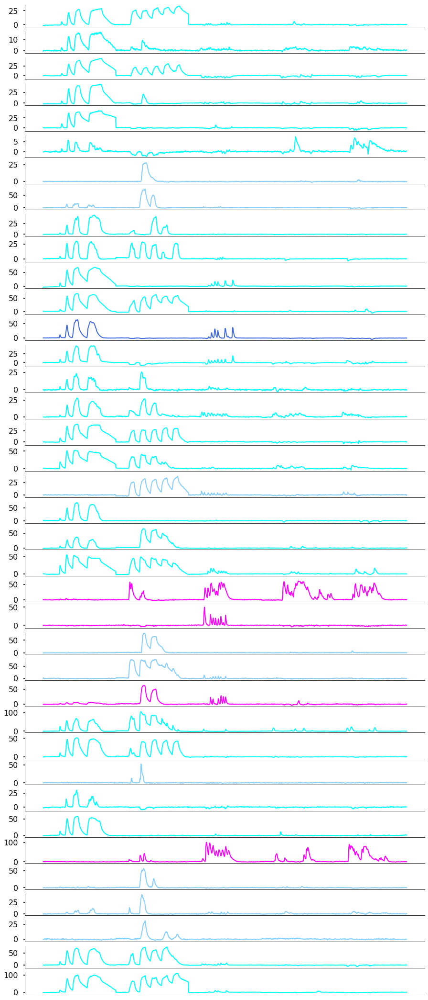

In [170]:
stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']
colors = [profile_to_color[c] for c in calb2_cells['profile']]
plot_single_traces(calb2_cells,colors=colors,stimuli=stimlist,axis=True,label=False,height=1,linewidth=2,alpha=1)
sns.despine();
plt.savefig('calb2_lars_traces.svg',transparent=True)

# Calb2-Cre/RSL-GCamp mice

In [53]:
julia = pd.read_csv('calb2cre_allcells.csv',header=None).T

In [55]:
# get global stats
stat_frame = get_global_stats(julia)
stat_frame['STAT_bottom50std'] = julia.apply(lambda trace:np.std(trace[trace <= np.quantile(trace,0.5)]),axis=1)


# split up traces into stimuli
stimlist = ['airpuff','brush_with','brush_against','hairpull1','pinch1','vibration']

split_traces=pd.DataFrame(julia.apply(lambda row:{stimulus:row.iloc[(i*200):((i+1)*200)].tolist()\
                                                 for i,stimulus in enumerate(stimlist)},axis=1),columns=['traces'])


max_frame = get_maxvalues(split_traces['traces'])

comb_frame = get_combined(max_frame)

ratio_frame = get_ratios(max_frame, comb_frame)
        
julia = pd.concat([split_traces,stat_frame,max_frame,comb_frame,ratio_frame],join='inner',axis=1)



In [56]:
# add ratios that are not in every ganglion
julia['RATIO_airpuff_vibration'] = julia['MAX_airpuff']/julia['MAX_vibration']
julia['RATIO_vibration_brush'] = julia['MAX_vibration']/julia['MAX_brush_with']
julia['RATIO_vibration_ht'] = julia['MAX_vibration']/julia['COMB_ht']
    

In [57]:
# profile julias cells
z = 10
thresh = julia.STAT_bottom50std * z
julia['profile'] = 'other'
julia.loc[np.logical_and(julia.MAX_airpuff > thresh,julia.RATIO_airpuff_brush > 2,\
                       ),'profile'] = 'airpuff'
julia.loc[np.logical_and.reduce((julia.MAX_brush_with > thresh,\
                                         julia.MAX_airpuff > thresh,
                                         julia.RATIO_airpuff_brush > 0.5,\
                                        julia.RATIO_airpuff_brush <= 2)),\
                       'profile'] = 'brushpuff'
julia.loc[np.logical_and.reduce((julia.MAX_brush_with > thresh,\
                                         julia.RATIO_airpuff_brush <= 0.5,
                                        julia.RATIO_lt_ht >= 0.33)),\
                       'profile'] = 'brush'
julia.loc[np.logical_and(julia.COMB_ht > thresh,julia.RATIO_lt_ht < 0.33),'profile'] = 'htspec'

julia.loc[np.logical_and.reduce((julia.MAX_vibration > thresh,\
                                  julia.RATIO_airpuff_vibration < 0.33,\
                                  julia.RATIO_vibration_brush > 3,
                                  julia.RATIO_vibration_ht >3)),'profile'] = 'vibration'

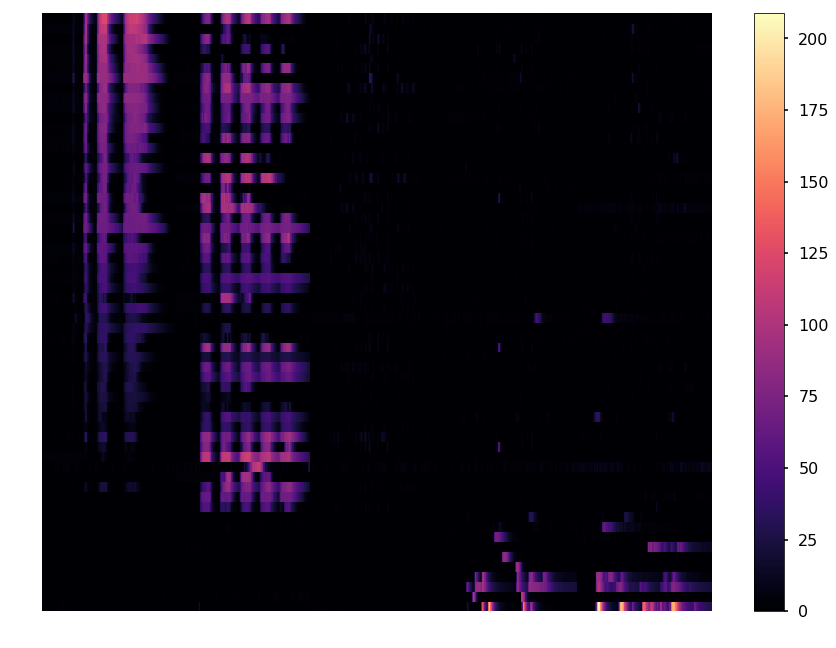

In [58]:
stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']

julia_airpuff = julia[julia.profile == 'airpuff'].sort_values('MAX_airpuff',ascending=True)[1:]
julia_vibration = julia[julia.profile == 'vibration'].sort_values('MAX_vibration',ascending=True)
julia_brushpuff = julia[julia.profile == 'brushpuff']
julia_brush = julia[julia.profile == 'brush'].sort_values('MAX_brush_with',ascending=False)
julia_ht = julia[julia.profile == 'htspec'].sort_values('COMB_ht',ascending=False)


julia = pd.concat([julia_ht,julia_brush,julia_vibration,julia_brushpuff,julia_airpuff])


_ = show_traces(julia[julia.STAT_max > 20],stimlist,profiles=None,figsize=(15,11),dropna=True,\
                           title='',vmin=0,vmax=None)
#plt.savefig('julia_heatmap.png',transparent=True,dpi=400)

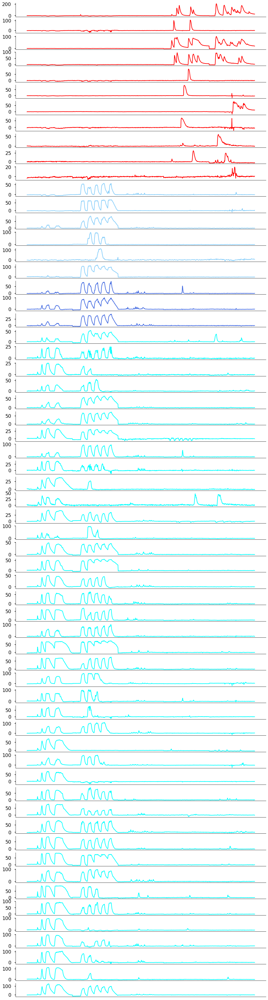

In [67]:

stimlist = ['airpuff','vibration','brush_with','hairpull1','pinch1']
colors = [profile_to_color[c] for c in julia['profile']]
plot_single_traces(julia,colors=colors,stimuli=stimlist,axis=True,label=False,height=1,linewidth=2,alpha=1)
sns.despine();
#plt.savefig('calb2_julia_traces.svg',transparent=True)

# Analyze receptive fields of original data

In [259]:
def get_rec_field(df,stim = 'hairpull1', height = 10, distance = 7, prominence=10):

    traces = []
    peaks = []
    plt.figure(figsize=[12,5])
    for row in df.iterrows():
        trace = row[1]['traces'][stim]

        traces.append([x/max(trace) for x in trace])
        trace_norm = [x/row[1]['STAT_bottom50std'] for x in trace]
        index = find_peaks(trace_norm,height=height,distance=distance,prominence=prominence)[0]
        peaks.append(index)

        plt.plot(trace_norm,color='black',alpha=0.1,linewidth=1)
        plt.scatter(index,[trace_norm[i] for i in index],color='red',alpha=0.5)
        

    stimulus_timepoints = np.array(find_peaks(plt.hist(np.concatenate(peaks),bins=100,range=[0,200])[0]/len(peaks),height=0.04,distance=3,prominence=0.04)[0] *2)
    stimulus_timepoints = np.atleast_2d(stimulus_timepoints).transpose()
    ax = plt.gca()
    for t in stimulus_timepoints.flatten():
        ax.axvline(x=t,linestyle ="--", color ="k")
    print(df.ganglion[0] +", " + stim + ": " + str(stimulus_timepoints.flatten().tolist()))    
    plt.title(df.ganglion[0] +", " + stim + ": " + str(stimulus_timepoints.flatten().tolist()))

    perc = []
    weighted = []
    for i,p in enumerate(peaks):
        dist = np.abs(p - stimulus_timepoints).min(axis=0)
        peaks[i] = p[dist<=6]
        perc.append(p.size/stimulus_timepoints.size)
        weighted.append(np.array(traces[i])[p].sum()/stimulus_timepoints.size)
    
    df['perc_'+stim] = perc
    df['weighted_'+stim] = weighted
    df['n_'+stim] = stimulus_timepoints.size
    
    return df

(2023, 108)
20180727, hairpull1: [94, 104, 114, 122, 130, 140]


/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydat

20180727, pinch1: [58, 66, 76, 82, 94, 106, 112, 126]
20180803, hairpull1: [48, 58, 66, 72, 80, 90, 104, 116, 122, 134, 144, 156]
20180803, pinch1: [30, 42, 52, 64, 74, 92, 100, 108, 114, 120, 132]
20180810, hairpull1: [44, 50, 62, 72, 80, 92, 100, 110, 120, 128, 150, 158]
20180810, pinch1: [38, 44, 50, 62, 70, 80, 90, 102, 116, 124, 144]
20180824, hairpull1: [60, 68, 78, 88, 98, 106, 116, 144, 158, 166, 176]
20180824, pinch1: [54, 64, 74, 86, 96, 116]
20181116, hairpull1: [62, 82, 90, 98, 108, 114, 122]
20181116, pinch1: [38, 48, 58, 66, 76, 96]
20181218, hairpull1: [42, 54, 68, 80, 92, 100, 116, 130]
20181218, pinch1: [34, 44, 62, 72, 82, 88, 98, 118, 124, 132]
20190301, hairpull1: [58, 64, 92, 108, 120, 136]
20190301, pinch1: [44, 52, 64, 72, 80, 94, 104, 122]
20190402, hairpull1: [46, 54, 62, 70, 80, 112, 120]
20190402, pinch1: [40, 48, 54, 66, 82, 92]
20190423, hairpull1: [40, 50, 62, 70, 80, 90, 98, 108, 118, 130]
20190423, pinch1: [56, 62, 78, 86, 92, 100, 106]
20190430, hairpul

/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


20190507, hairpull1: [26, 38, 56, 70, 78, 88, 98, 108]
20190507, pinch1: [34, 46, 62, 74, 84, 100, 108]
20190510, hairpull1: [38, 46, 56, 64, 74, 82, 90, 98, 106, 114]
20190510, pinch1: [38, 46, 54, 66, 76, 86, 102]
20190719, hairpull1: [26, 32, 40, 48, 58, 66, 74, 80, 94, 102, 110, 118]
20190719, pinch1: [20, 30, 40, 50, 60, 70, 78, 88]
20190806, hairpull1: [32, 42, 56, 68, 80, 86, 94, 100, 106, 116, 126, 140, 156]
20190806, pinch1: [28, 38, 56, 72, 88, 104]
20190913, hairpull1: [32, 42, 52, 68, 80, 94, 106, 118]
20190913, pinch1: [30, 38, 48, 62, 70]
20190924, hairpull1: [62, 70, 82, 88, 94, 104, 114, 126, 136, 146, 160, 170, 182, 190]
20190924, pinch1: [52, 60, 72, 82, 96, 104, 114, 126]
20190927, hairpull1: [38, 54, 68, 74, 84, 96, 112, 120, 138, 144, 156, 176]
20190927, pinch1: [36, 52, 62, 82, 94, 104, 116, 126, 138, 150]
20190930, hairpull1: [34, 48, 60, 70, 82, 92, 104, 114, 128, 140]
20190930, pinch1: [36, 46, 64, 78, 96, 110]
20191004, hairpull1: [40, 52, 64, 78, 94, 104, 116

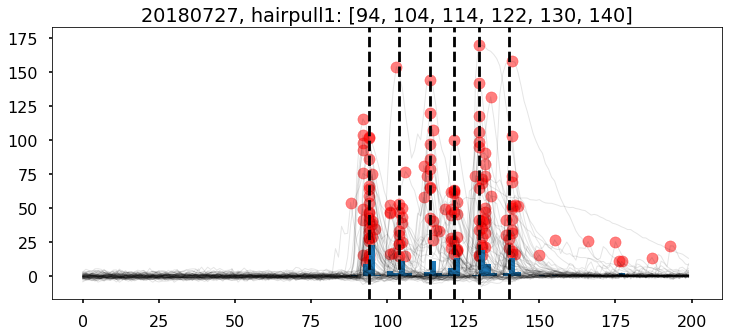

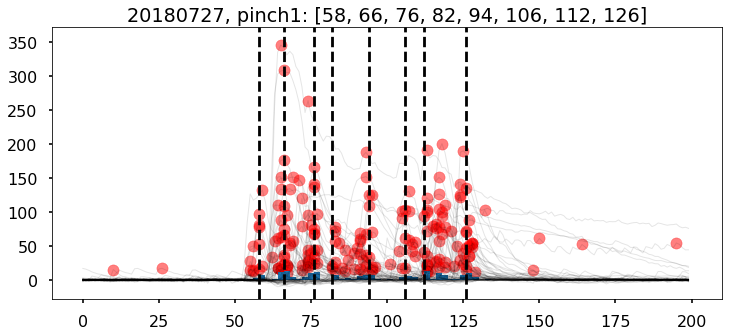

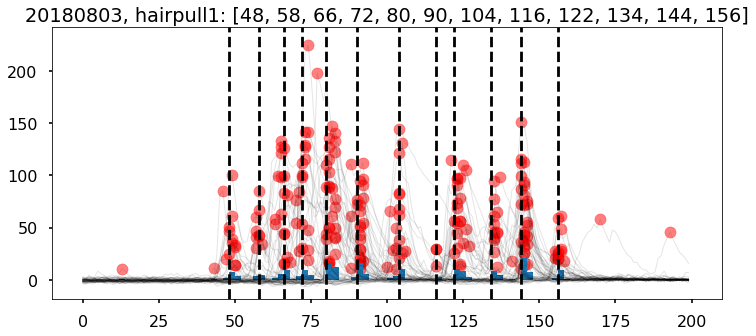

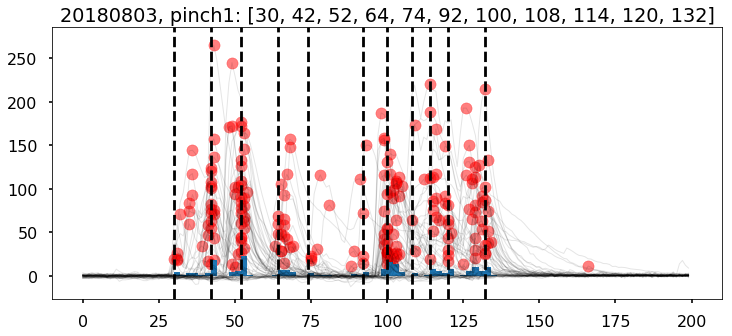

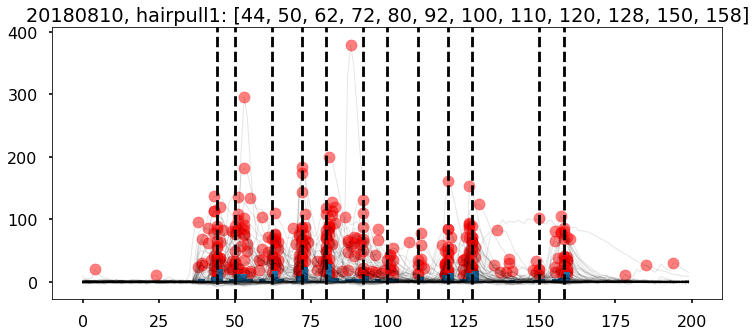

...

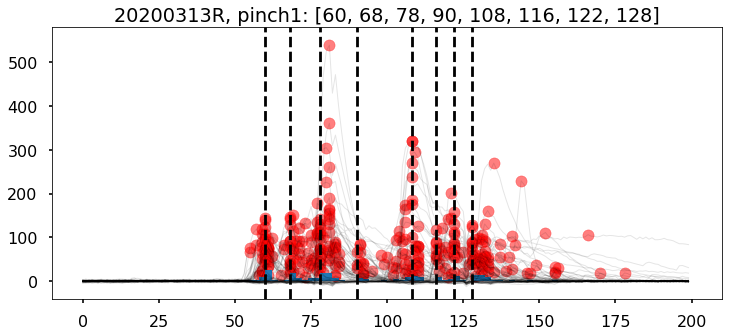

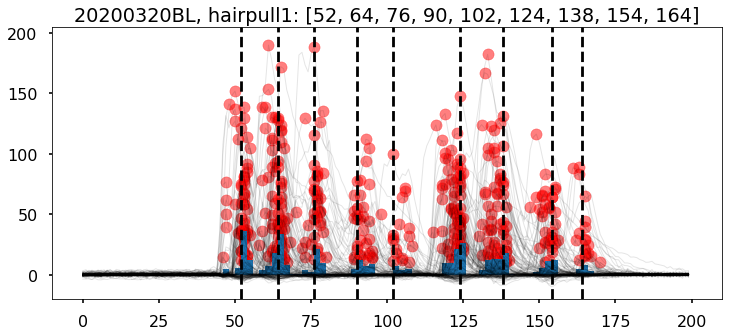

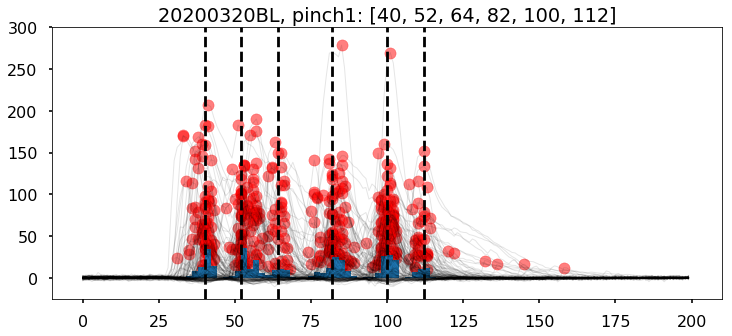

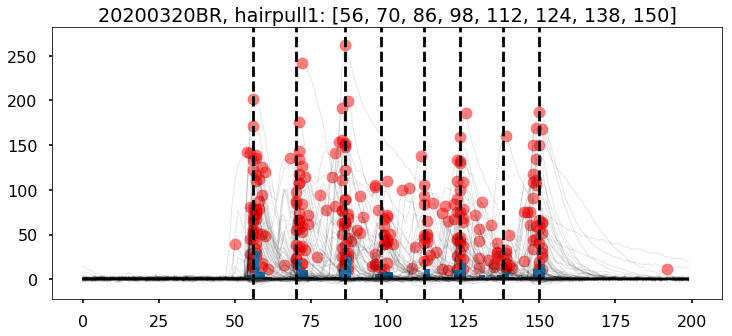

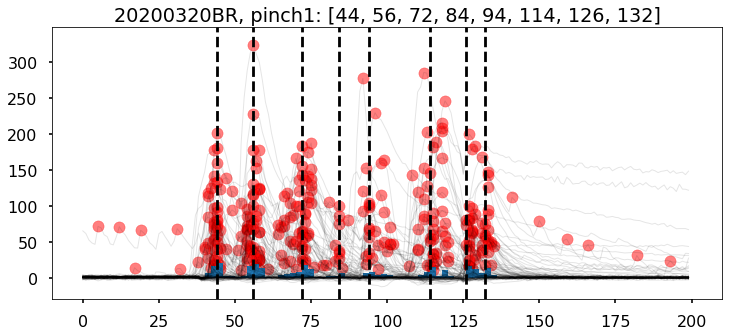

In [260]:
tmp_group = []

for g in wt_df.groupby('ganglion'):
    tmp = get_rec_field(g[1],stim='hairpull1')
    tmp_group.append(get_rec_field(tmp,stim='pinch1'))
    
new_wt_df = pd.concat(tmp_group)


### calculate receptive field index for hairpull in knock-out

(725, 108)
20191119, hairpull1: [58, 64, 78, 94, 104, 112, 126, 132]


/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydat

20191119, pinch1: [60, 66, 80, 90, 96, 108, 114, 136, 142, 156]
20200103, hairpull1: [40, 56, 72, 104, 120, 156]
20200103, pinch1: [46, 64, 78, 92, 118]
20200107, hairpull1: [60, 84, 104, 122, 136, 146]
20200107, pinch1: [58, 68, 78, 94, 110, 146]
20200218, hairpull1: [38, 54, 82, 98, 108, 122, 146, 170]
20200218, pinch1: [44, 64, 80, 94, 102, 126, 140]
20200306, hairpull1: [30, 40, 60, 78, 100, 122, 136, 148, 172]
20200306, pinch1: [56, 70, 82, 98, 112, 122, 142, 150, 166]
20200320A, hairpull1: [36, 50, 74, 88, 96, 108, 120, 132]
20200320A, pinch1: [60, 78, 94, 122, 136]
20200320C, hairpull1: [52, 72, 86, 106, 120, 148, 162, 174]
20200320C, pinch1: [42, 60, 74, 92, 106, 118]
(725, 114)


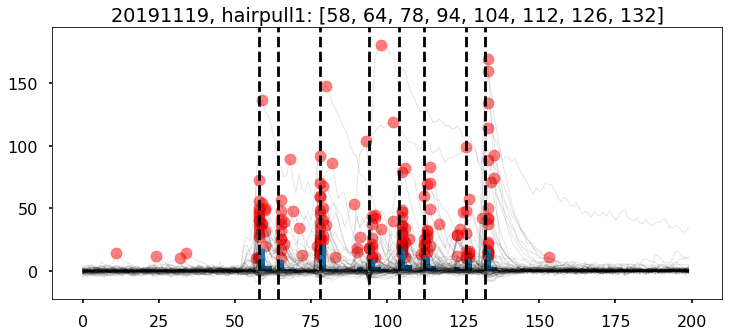

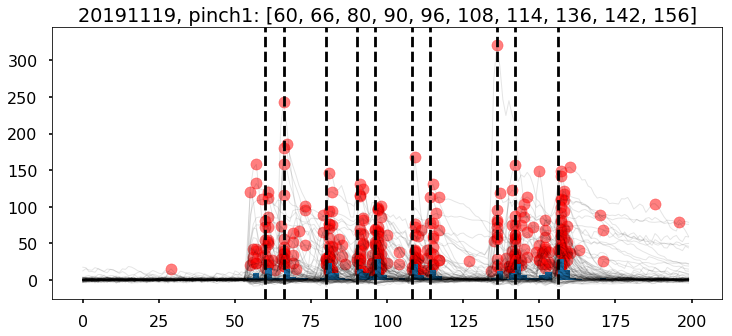

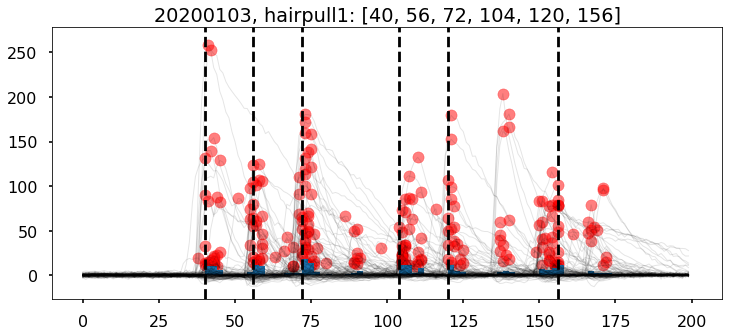

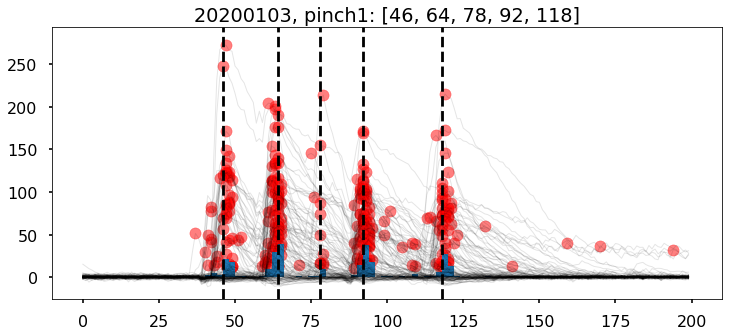

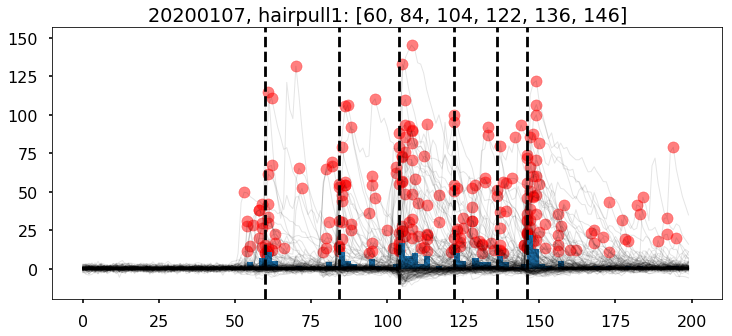

...

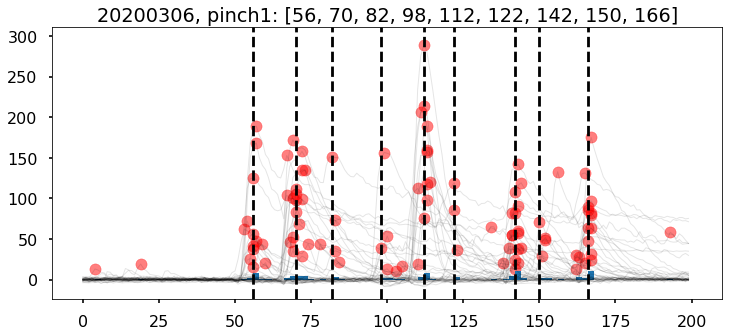

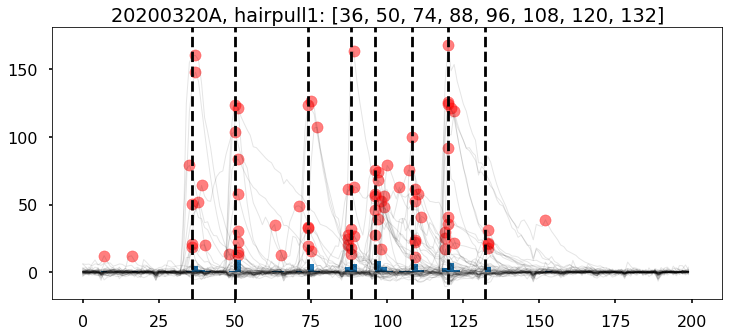

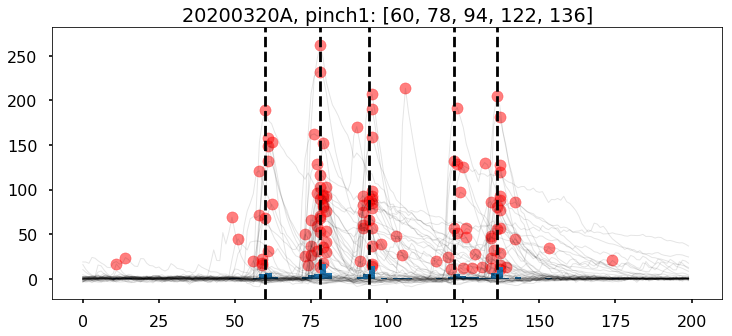

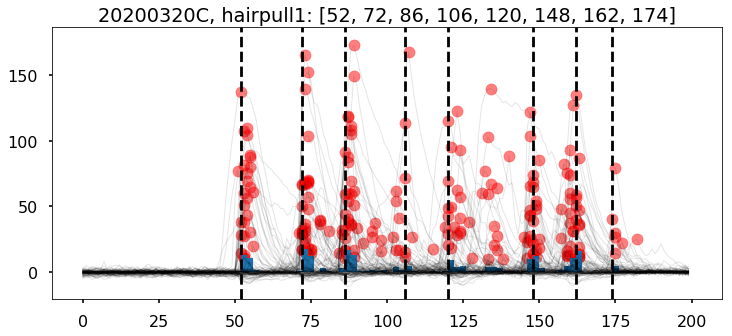

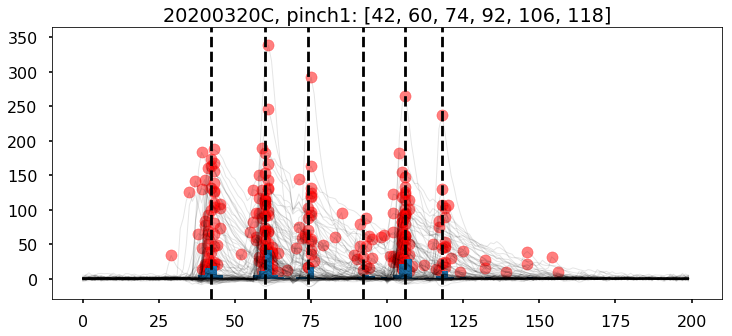

In [261]:
tmp_group = []
print (ko_df.shape)
for g in ko_df.groupby('ganglion'):
    tmp = get_rec_field(g[1],stim='hairpull1')
    tmp_group.append(get_rec_field(tmp,stim='pinch1'))
    
new_ko_df = pd.concat(tmp_group)
print(new_ko_df.shape)

### ko vs wt comparison in receptive field index

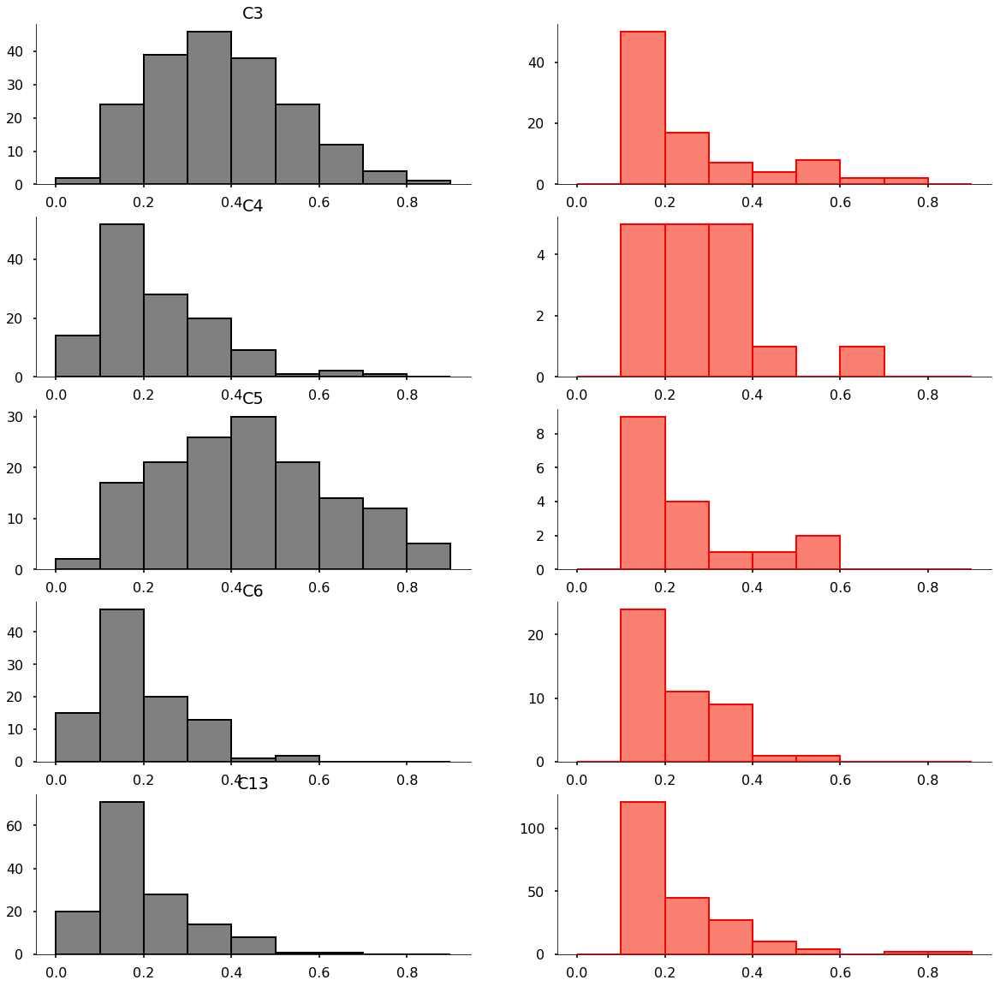

In [279]:
plt.figure(figsize=[20,20]) 
class_list = ['C3','C4','C5','C6','C13']
for i,c in enumerate(class_list):
    plt.subplot(len(class_list),2,2*i+1)
    plt.hist(new_wt_df[new_wt_df.weighted_hairpull1 > 0].loc[new_wt_df['class']==c, 'weighted_hairpull1'],bins=[x *0.1 for x in range(10)],edgecolor='black',color='grey',linewidth=2,orientation='vertical')
    plt.title(c)
    sns.despine()
    plt.subplot(len(class_list),2,2*i+2)
    plt.hist(new_ko_df[new_ko_df.weighted_hairpull1 > 0].loc[new_ko_df['class']==c, 'weighted_hairpull1'],bins=[x *0.1 for x in range(10)],edgecolor='red',color='salmon',linewidth=2,orientation='vertical')
    
    sns.despine()

check that means of the data are normally distributed

/Users/gu6/anaconda/envs/py36/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<Figure size 1440x1440 with 0 Axes>

<Figure size 576x576 with 0 Axes>

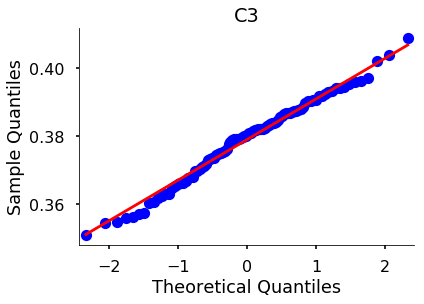

<Figure size 576x576 with 0 Axes>

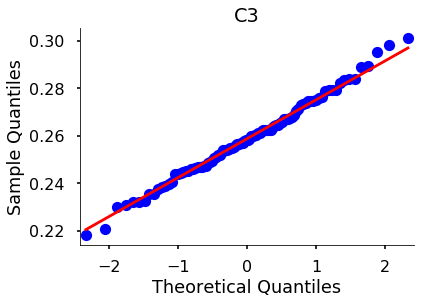

<Figure size 576x576 with 0 Axes>

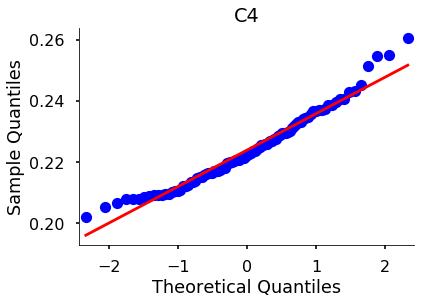

<Figure size 576x576 with 0 Axes>

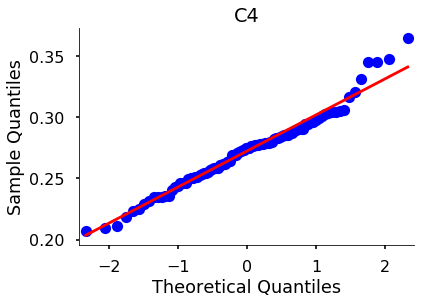

<Figure size 576x576 with 0 Axes>

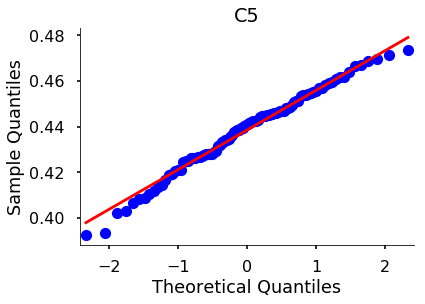

<Figure size 576x576 with 0 Axes>

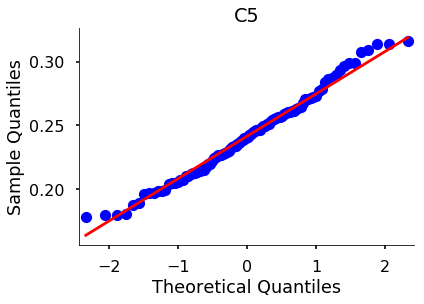

<Figure size 576x576 with 0 Axes>

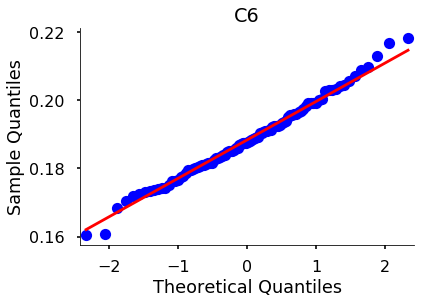

<Figure size 576x576 with 0 Axes>

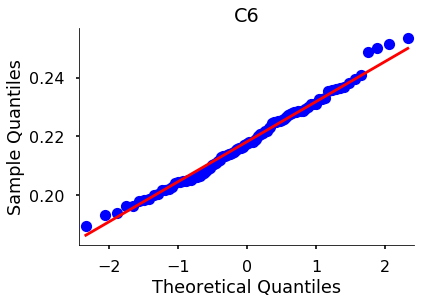

<Figure size 576x576 with 0 Axes>

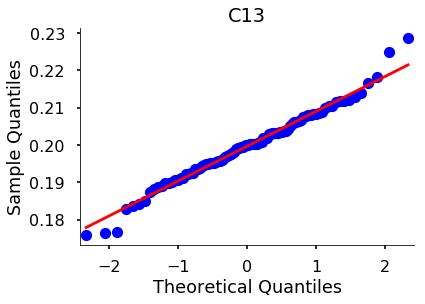

<Figure size 576x576 with 0 Axes>

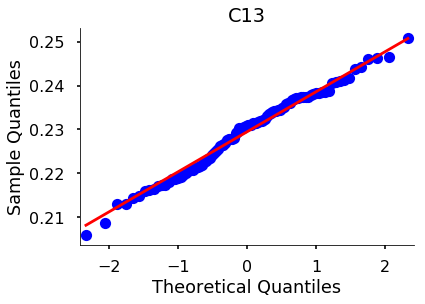

In [320]:
plt.figure(figsize=[20,20]) 
class_list = ['C3','C4','C5','C6','C13']
for i,c in enumerate(class_list):
    plt.figure(figsize=[8,8]) 
    means = []
    beta = new_wt_df[new_wt_df.weighted_hairpull1 > 0].loc[new_wt_df['class']==c, 'weighted_hairpull1'].tolist()
    for _ in range(100):
        means.append(np.mean(random.choices(beta,k=len(beta))))
    qqplot(np.array(means),line='s')
    plt.title(c)
    sns.despine()
    
    plt.figure(figsize=[8,8]) 
    means = []
    beta = new_ko_df[new_ko_df.weighted_hairpull1 > 0].loc[new_ko_df['class']==c, 'weighted_hairpull1'].tolist()
    for j in range(100):
        means.append(np.mean(random.choices(beta,k=len(beta))))
    qqplot(np.array(means),line='s')
    plt.title(c)
    sns.despine()
    

Significance test for ko vs wt

In [322]:
p_vals = []
p_vals_u = []
for i,c in enumerate(class_list):
    a = new_wt_df.loc[np.logical_and(new_wt_df.weighted_hairpull1 > 0,new_wt_df['class']==c),'weighted_hairpull1']
    b = new_ko_df.loc[np.logical_and(new_ko_df.weighted_hairpull1 > 0,new_ko_df['class']==c),'weighted_hairpull1']
    p_vals.append(ttest_ind(a,b,nan_policy='omit',equal_var=False).pvalue)
    p_vals_u.append(mannwhitneyu(a,b,alternative='greater').pvalue)

    print(a.mean(), b.mean())
print(pd.Series(multipletests(p_vals,method = 'hs')[1]))



0.37806997609403487 0.25856625674080586
0.2235573987134006 0.2716950684567146
0.43874617890365697 0.24560159174141857
0.18842943670356824 0.21694618265645763
0.19898243457293358 0.2271556464268805
0    4.512706e-08
1    2.222277e-01
2    2.229455e-04
3    2.222277e-01
4    7.362013e-02
dtype: float64


# Analysis of receptive fields in 4 pinch ganglia

In [413]:
trace_frame = pd.read_csv('4pinches_wt.csv',header=0,index_col=0)

In [414]:

# get global stats
stat_frame = get_global_stats(trace_frame)
stat_frame['STAT_bottom50std'] = trace_frame.apply(lambda trace:np.std(trace[trace <= np.quantile(trace,0.5)]),axis=1)


# split up traces into stimuli
stimlist = ['brush_with','pinch1','pinch2','pinch3','pinch4']
split_traces = split_trace(trace_frame,stimlist)

# get peak values for different stimuli
max_frame = get_maxvalues(split_traces['traces'])
comb_frame = get_combined(max_frame)

# join all results
frame = pd.concat([split_traces,stat_frame,max_frame,comb_frame,genotype],join='inner',axis=1)

    

In [415]:
z=10
# divide into brush and pinch responsive cells
frame['brush_bin'] = np.logical_and(frame.MAX_brush_with >= z * frame.STAT_bottom50std,frame.MAX_brush_with >= 0.33 * frame.COMB_pinch)
frame['pinch_bin'] = frame.COMB_pinch >= z * frame.STAT_bottom50std

# get order of responses to 4 pinches by peak level
tmp = frame.filter(regex = r'MAX_pinch', axis = 1).apply(lambda s: s.nlargest(4).index.tolist(), axis=1)
tmp.columns = ['opt1','opt2','opt3','opt4']
frame = pd.concat([frame,tmp],axis=1)

# get a few measures for the size of the receptive field
frame['dispersion'] = np.abs(frame.filter(regex = r'MAX_pinch', axis = 1).std(axis=1)/frame.filter(regex = r'pinch', axis = 1).mean(axis=1))
frame['narrowness'] = frame.apply(lambda row: row[row['opt1']]/row.filter(regex = r'MAX_pinch').sum(),axis=1)
frame['wideness'] = frame.apply(lambda row: row.filter(regex = r'MAX_pinch').sum()/(row[row['opt1']]*4),axis=1)

cutoff = 0.35
frame['widefield'] = frame['wideness'] > cutoff

                        

In [416]:
wt_frame = frame.sort_values(by =['brush_bin','pinch_bin','widefield','opt1','opt2','opt3','opt4','wideness'],\
                         ascending = [True,False,True,False,False,False,False,True])

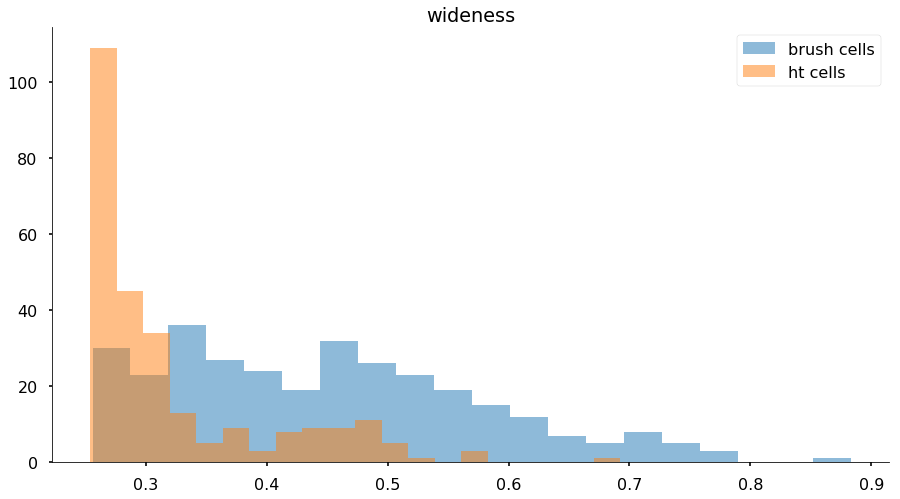

In [409]:
plt.figure(figsize=[15,8])
plt.hist(wt_frame[wt_frame.brush_bin].wideness,bins=20,alpha=0.5)
plt.hist(wt_frame[~wt_frame.brush_bin].wideness,bins=20,alpha=0.5)
plt.legend(['brush cells','ht cells'])
plt.title('wideness');
sns.despine()

<Figure size 1440x1440 with 0 Axes>

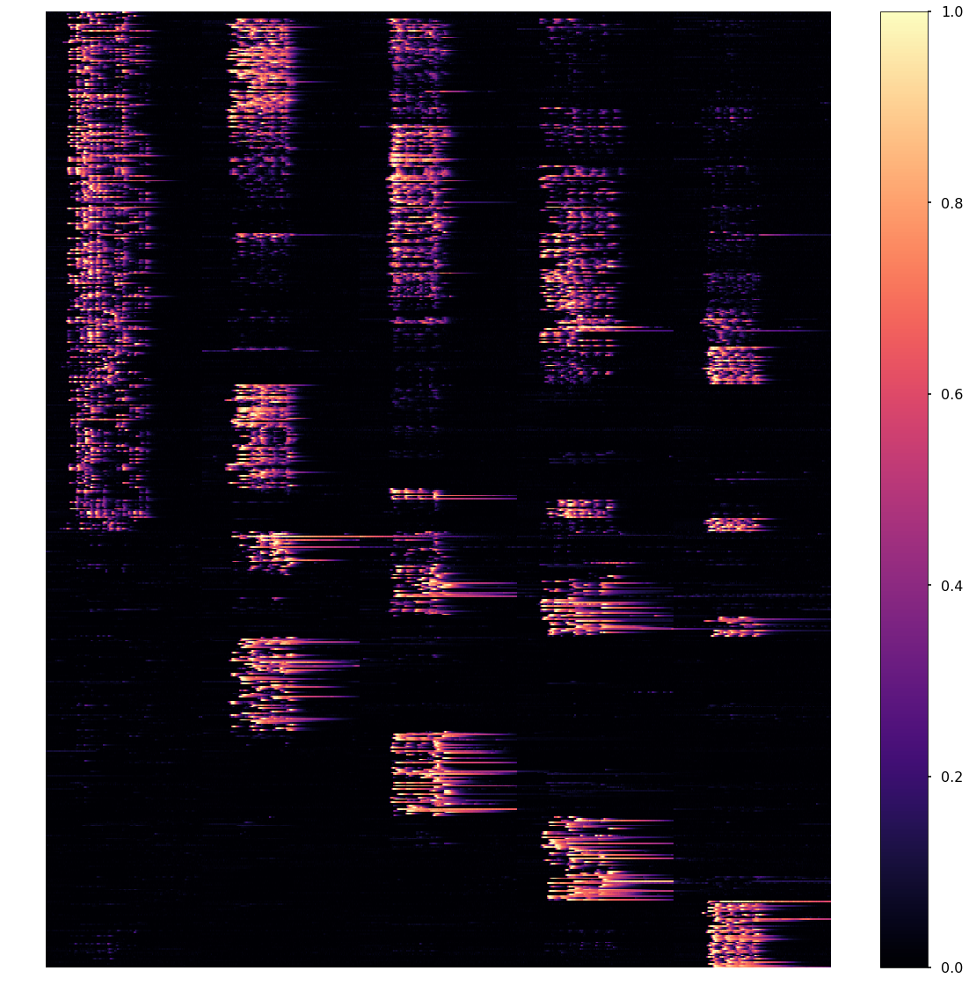

In [420]:
plt.figure(figsize=[20,20])
_ = show_traces(wt_frame,stimlist,profiles=None,dropna=True,figsize=[20,20],normalize=True,\
                           title='',vmin=0,vmax=None)

#plt.savefig('wt-4pinch-heatmap.png',transparent=True,dpi=400)

In [419]:
print(np.logical_and.reduce((wt_frame.pinch_bin,wt_frame.brush_bin,wt_frame.widefield)).sum())
print(np.logical_and.reduce((wt_frame.pinch_bin,wt_frame.brush_bin,~wt_frame.widefield)).sum())
print(np.logical_and.reduce((wt_frame.pinch_bin,~wt_frame.brush_bin,wt_frame.widefield)).sum())
print(np.logical_and.reduce((wt_frame.pinch_bin,~wt_frame.brush_bin,~wt_frame.widefield)).sum())


222
89
64
201
